<a href="https://colab.research.google.com/github/Has970211/Digital-Filter-Design/blob/master/U_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Split Data set into train set and validation set**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
PATH_OF_DATA= '/content/gdrive/"My Drive"/ISBI'
!ls {PATH_OF_DATA}

train  train_set  valid_set


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader
import numpy as np
import torchvision.datasets as dset
import json
import shutil #copy images to train and valid dirs
import os #files and diresctories manipulation
import math

In [ ]:
train_dir = '/content/gdrive/My Drive/ISBI/'
parent_dir = '/content/gdrive/My Drive/ISBI/train/' 

In [ ]:
os.chdir(parent_dir)
img_mask = list(filter(lambda x: os.path.isdir(x), os.listdir()))
for folders in img_mask:
  print(folders)

mask
image


In [ ]:
#create training and validation set
#data_set_dirs = ['train_set','valid_set']

#for dirs in data_set_dirs:
 #path = train_dir+'/'+dirs
  #os.mkdir(path,511)

#des_dirs = ['images','masks']
#for dirs in des_dirs:
 # path = train_dir+'/'+'train_set'+'/'+dirs
 # os.mkdir(path,511)
#for dirs in des_dirs:
 # path = train_dir+'/'+'valid_set'+'/'+dirs
 # os.mkdir(path,511)

***Training set - 25***
***validation set - 5*** 

In [ ]:


#create_train_valid_set()

**Data Augmentation**

  
> **Testing with Augmentation techniques**



In [ ]:
import random
import imageio
import cv2
from matplotlib import pyplot as plt

import albumentations as A

(512, 512) (512, 512)


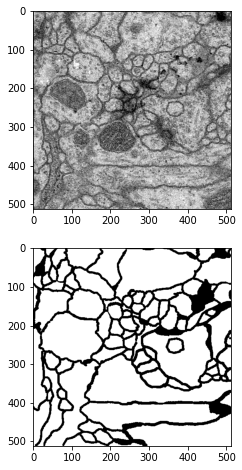

In [ ]:
image = imageio.imread(train_dir+'train_set/'+'images/20.png/')
mask = imageio.imread(train_dir+'train_set/'+'masks/20.png/')
print(image.shape,mask.shape)

def visualize(image, mask, original_image=None, original_mask=None):
    fontsize = 18

    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))

        ax[0].imshow(image,cmap='gray')
        ax[1].imshow(mask,cmap='gray')
    else:
        f, ax = plt.subplots(2, 2, figsize=(8, 8))

        ax[0, 0].imshow(original_image,cmap='gray')
        ax[0, 0].set_title('Original image', fontsize=fontsize)

        ax[1, 0].imshow(original_mask,cmap='gray')
        ax[1, 0].set_title('Original mask', fontsize=fontsize)

        ax[0, 1].imshow(image,cmap='gray')
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)

        ax[1, 1].imshow(mask,cmap='gray')
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)


visualize(image,mask)




>Since Image size is (512,512),using mirror techniques,
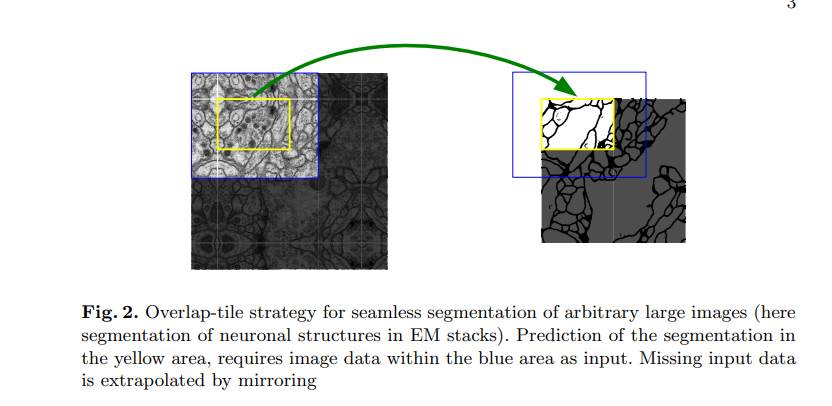

*   






(572, 572) (572, 572)


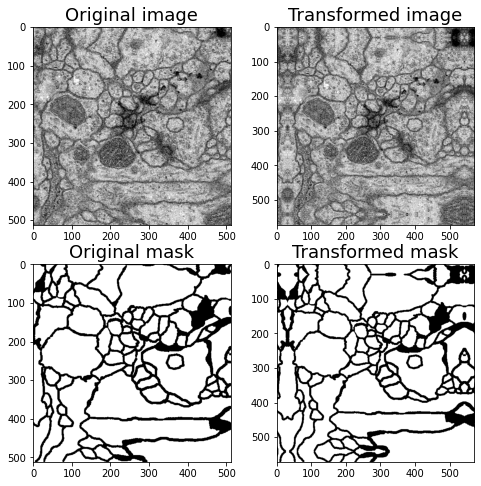

In [ ]:
aug = A.PadIfNeeded(min_height=572, min_width=572,p=1)
augmented = aug(image=image, mask=mask)
image_padded = augmented['image']
mask_padded = augmented['mask']
print(image_padded.shape, mask_padded.shape)
visualize(image_padded,mask_padded,original_image=image,original_mask=mask)

**Data Augmentation Technique - Elastic Deformation**




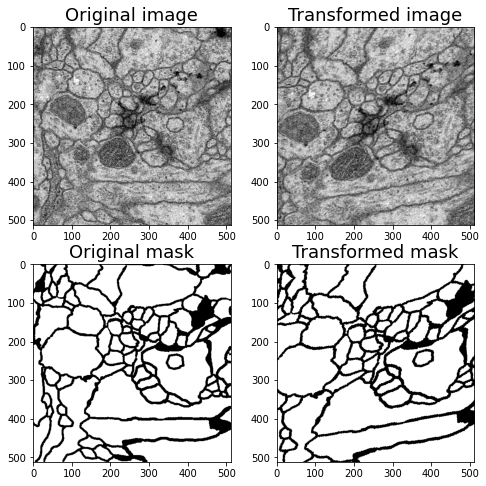

In [ ]:
aug = A.ElasticTransform(sigma=10,interpolation=3,p=1)
augmented = aug(image=image, mask=mask)
image_elastic = augmented['image']
mask_elastic = augmented['mask']

visualize(image_elastic, mask_elastic, original_image=image, original_mask=mask)

**Data Loading**

In [ ]:
import glob
data_path1 = train_dir+'train_set/'
data_path2= train_dir+'valid_set/'

In [ ]:
class ImageDataset(Dataset):
  def __init__(self,data_path,transform = None):
    self.image_list = glob.glob(data_path+'images/*.png')
    self.mask_list = glob.glob(data_path+'masks/*.png')
    self.transform=transform
    print(len(self.image_list),len(self.mask_list))

  def __len__(self):
    return(len(self.image_list))

  def __getitem__(self,index):
    image = imageio.imread(self.image_list[index])
    mask = imageio.imread(self.mask_list[index])

    if self.transform is not None:
      transformed = self.transform(image=image, mask=mask)
      image = transformed["image"]
      mask = transformed["mask"]
    return image, mask

  

train_set=ImageDataset(data_path1,transform=None)

25 25


In [ ]:
from albumentations.pytorch import ToTensor
transform = A.Compose([
                       A.Resize(width=388, height=388,p=1),
                       A.PadIfNeeded(min_height=572, min_width=572,p=1),
                       A.ElasticTransform(sigma=10,interpolation=3,p=1),
                       #A.VerticalFlip(p=0.5),
                       #A.HorizontalFlip(p=0.5)
                       A.Flip(p=0.8),
                       A.RandomRotate90(p=0.8),
                       A.RandomBrightnessContrast(p=0.8),
                       ToTensor(num_classes=2)
                       ])
t=A.Compose([
             A.Resize(width=388, height=388,p=1),
             A.PadIfNeeded(min_height=572, min_width=572,p=1),
             ToTensor(num_classes=2)
             ])

In [ ]:
train_set=ImageDataset(data_path1, transform=transform)
print(len(train_set))
valid_Set=ImageDataset(data_path2, transform=t)

25 25
25
5 5


In [ ]:
train_loader = DataLoader(dataset=train_set,batch_size=4,shuffle=True)
print(len(train_loader))
val_loader = DataLoader(dataset=valid_Set,batch_size=1)

7


**Model**

In [ ]:
class UNet(nn.Module):
  def __init__(self):
      super(UNet, self).__init__()

    
      self.conv1 = nn.Conv2d(in_channels=1, out_channels=64,kernel_size=(3,3))
      self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3,3))
      
      self.max1 = nn.MaxPool2d(kernel_size=(2,2),stride=2)
      self.bn1 = nn.BatchNorm2d(64, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv3 = nn.Conv2d(in_channels=64,out_channels=128,kernel_size=(3,3))
      self.conv4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3,3))
      
      
      self.max2 = nn.MaxPool2d(kernel_size=(2,2),stride=2)
      self.bn2 = nn.BatchNorm2d(128, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv5 = nn.Conv2d(in_channels=128,out_channels=256,kernel_size=(3,3))
      self.conv6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=(3,3))
      
      self.max3 = nn.MaxPool2d(kernel_size=(2,2),stride=2)
      self.bn3 = nn.BatchNorm2d(256, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv7 = nn.Conv2d(in_channels=256,out_channels=512,kernel_size=(3,3))
      self.conv8 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3))
      
      self.max4 = nn.MaxPool2d(kernel_size=(2,2),stride=2)
      self.bn4 = nn.BatchNorm2d(512, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv9 = nn.Conv2d(in_channels=512,out_channels=1024,kernel_size=(3,3))
      self.conv10 = nn.Conv2d(in_channels=1024, out_channels=1024, kernel_size=(3,3))
      
      self.up1 = nn.Upsample(scale_factor=2)  #MaxUnpool2d(kernel_size=(2,2),stride=2)
      self.pad1 = nn.ZeroPad2d(padding=((0,1,0,1)))
      self.bn5 = nn.BatchNorm2d(1024, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv11 = nn.Conv2d(in_channels=1024,out_channels=512, kernel_size=(2,2),stride=1)
      self.conv12 = nn.Conv2d(in_channels=1024,out_channels=512,kernel_size=(3,3))
      self.BN1 = nn.BatchNorm2d(512, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv13 = nn.Conv2d(in_channels=512,out_channels=512,kernel_size=(3,3))
      #self.dropout1 = nn.Dropout(p=0.2, inplace=True)
      
      self.up2 = nn.MaxUnpool2d(kernel_size=(2,2),stride=2)
      self.pad2 = nn.ZeroPad2d(padding=((0,1,0,1)))
      self.bn6 = nn.BatchNorm2d(512, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv14 = nn.Conv2d(in_channels=512,out_channels=256, kernel_size=(2,2),stride=1)
      self.conv15 = nn.Conv2d(in_channels=512,out_channels=256,kernel_size=(3,3))
      self.BN2 = nn.BatchNorm2d(256, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv16 = nn.Conv2d(in_channels=256,out_channels=256,kernel_size=(3,3))
      #self.dropout2 = nn.Dropout(p=0.2, inplace=True)
      
      self.up3 = nn.MaxUnpool2d(kernel_size=(2,2),stride=2)
      self.pad3 = nn.ZeroPad2d(padding=((0,1,0,1)))
      self.bn7 = nn.BatchNorm2d(256, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv17 = nn.Conv2d(in_channels=256,out_channels=128, kernel_size=(2,2),stride=1)
      self.conv18 = nn.Conv2d(in_channels=256,out_channels=128,kernel_size=(3,3))
      self.BN3 = nn.BatchNorm2d(128, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv19 = nn.Conv2d(in_channels=128,out_channels=128,kernel_size=(3,3))
      #self.dropout3 = nn.Dropout(p=0.2, inplace=True)
      
      self.up4 = nn.MaxUnpool2d(kernel_size=(2,2),stride=2)
      self.pad4 = nn.ZeroPad2d(padding=((0,1,0,1)))
      self.bn8 = nn.BatchNorm2d(128, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv20 = nn.Conv2d(in_channels=128,out_channels=64, kernel_size=(2,2),stride=1)
      self.conv21 = nn.Conv2d(in_channels=128,out_channels=64,kernel_size=(3,3))
      self.BN4 = nn.BatchNorm2d(64, eps=1e-05, momentum=0.099, affine=True, track_running_stats=True)
      self.conv22 = nn.Conv2d(in_channels=64,out_channels=64,kernel_size=(3,3))
      self.dropout4 = nn.Dropout(p=0.2, inplace=True)
      
      self.conv23 = nn.Conv2d(in_channels=64,out_channels=2,kernel_size=(1,1))
      self.dropout5 = nn.Dropout(p=0.2, inplace=True)
      


  def forward(self,x):
      x1=F.relu(self.conv2(F.relu(self.conv1(x))))

      x2=self.max1(x1)
      x2=self.bn1(x2)
      x2=F.relu(self.conv4(F.relu(self.conv3(x2))))

      x3=self.max2(x2)
      x3=self.bn2(x3)
      x3=F.relu(self.conv6(F.relu(self.conv5(x3))))

      x4=self.max3(x3)
      x4=self.bn3(x4)
      x4=F.relu(self.conv8(F.relu(self.conv7(x4))))

      x5=self.max4(x4)
      x5=self.bn4(x5)
      x5=F.relu(self.conv10(F.relu(self.conv9(x5))))
      
      x6=self.pad1(self.up1(x5))
      x6=self.bn5(x6)
      x6=F.relu(self.conv11(x6))
      x7=torch.cat((x6,x4[:,:,4:-4,4:-4]),1)
      x7 = F.relu(self.conv12(x7))
      x7=self.BN1(x7)
      x7=F.relu(self.conv13(x7))
      

      x8=self.pad1(self.up1(x7))
      x8=self.bn6(x8)
      x8=F.relu(self.conv14(x8))
      x9=torch.cat((x8,x3[:,:,16:-16,16:-16]),1)
      x9=F.relu(self.conv15(x9))
      x9=self.BN2(x9)
      x9=F.relu(self.conv16(x9))

      x10=self.pad1(self.up1(x9))
      x10=self.bn7(x10)
      x10=F.relu(self.conv17(x10))
      x11=torch.cat((x10,x2[:,:,40:-40,40:-40]),1)
      x11=F.relu(self.BN3(self.conv19(F.relu(self.conv18(x11)))))

      x12=self.pad1(self.up1(x11))
      x12-self.bn8(x12)
      x12=F.relu(self.conv20(x12))
      x13=torch.cat((x12,x1[:,:,88:-88,88:-88]),1)
      x13=self.dropout5(F.relu(self.conv23(self.dropout4(F.relu(self.BN4(self.conv22(F.relu(self.conv21(x13)))))))))

      return x13

model=UNet()

In [ ]:
#model=UNet()


#summary(model,(1,572,572))


In [ ]:
model

UNet(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (max1): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
  (max2): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
  (max3): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv7): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv8): Conv2d(51

**Training Loop**

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [ ]:
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.0001)

epoch=0
#writer = SummaryWriter()
total_epochs=900

In [ ]:
from tqdm.auto import tqdm
while epoch<total_epochs:
    print("Starting Epoch",epoch)

    train_loss = 0
    val_loss = 0
    
    #train_accurate = 0
    # val_accurate = 0
    
    model.cuda()
    model.train() #Enter train mode
  
    for inputs, labels in tqdm(train_loader):
        
        
        inputs, labels = inputs.to(device,dtype=torch.long), labels.to(device, dtype=torch.long) # Move to device #, dtype=torch.long
        inputs.unsqueeze_(1) #Add channel dimension to input image
        # labels.unsqueeze_(1)
        labels = F.pad(labels,(-92,-92,-92,-92))

        # print(inputs.shape, labels.shape)

        optimizer.zero_grad() # Clear optimizers
        
        output1 = model.forward(inputs.float()) # Forward pass
            
        loss = loss_function(output1, labels) #
        
        loss.backward() # Calculate gradients (backpropogation)
        
        optimizer.step() # Adjust parameters based on gradients
        
        train_loss += loss.item()*inputs.size(0)# Add the loss to the training set's rnning loss
        #train_accuracy+=c.item()

        
    
    model.cuda()
    model.eval() #Enter eval mode
    with torch.no_grad(): # Tell torch not to calculate gradients
       for inputs, labels in tqdm(val_loader):
            
             inputs, labels = inputs.to(device,dtype=torch.long), labels.to(device, dtype=torch.long) # Move to device #, dtype=torch.long
             inputs.unsqueeze_(1)
             #labels.unsqueeze_(1)
             labels = F.pad(labels,(-92,-92,-92,-92))
             output = model.forward(inputs.float()) # Forward pass
            
             valloss = loss_function(output, labels) # Calculate Loss
            
             val_loss += valloss.item()*inputs.size(0) # Add loss to the validation set's running loss
            
      
            
    
    # Get the average loss for the entire epoch
    train_loss = train_loss/len(train_loader.dataset)
    valid_loss = val_loss/len(val_loader.dataset)
   # # Print out the information
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch, train_loss, valid_loss))
    #print('Epoch: {} \tTraining Loss: {:.6f} '.format(epoch, train_loss))

    # val_accuracy = val_accurate/len(val_loader.dataset) *100
    #train_accuracy = train_accurate/len(train_loader.dataset) *100
    # print('\t \tTraining Accuracy: {:.3f} \tValidation Accuracy: {:.3f}'.format( train_accuracy, val_accuracy))
    #print('Epoch: {} \tTraining Accuracy: {:.6f} '.format(epoch, train_accuracy))


    #writer.add_scalar('Loss/train', train_loss, epoch)
    # writer.add_scalar('Loss/val', valid_loss, epoch)
    #writer.add_scalar('Accuracy/train', train_accuracy, epoch)
    # writer.add_scalar('Accuracy/val', val_accuracy, epoch)
    
    print("\n")

    epoch+=1

Starting Epoch 0



Epoch: 0 	Training Loss: 0.574181 	Validation Loss: 0.510605


Starting Epoch 1



Epoch: 1 	Training Loss: 0.562364 	Validation Loss: 0.517793


Starting Epoch 2



Epoch: 2 	Training Loss: 0.568747 	Validation Loss: 0.517587


Starting Epoch 3



Epoch: 3 	Training Loss: 0.565956 	Validation Loss: 0.572951


Starting Epoch 4



Epoch: 4 	Training Loss: 0.568774 	Validation Loss: 0.522300


Starting Epoch 5



Epoch: 5 	Training Loss: 0.568266 	Validation Loss: 0.515187


Starting Epoch 6



Epoch: 6 	Training Loss: 0.569927 	Validation Loss: 0.515123


Starting Epoch 7



Epoch: 7 	Training Loss: 0.567598 	Validation Loss: 0.519451


Starting Epoch 8



Epoch: 8 	Training Loss: 0.569400 	Validation Loss: 0.514475


Starting Epoch 9



Epoch: 9 	Training Loss: 0.565424 	Validation Loss: 0.515437


Starting Epoch 10



Epoch: 10 	Training Loss: 0.566948 	Validation Loss: 0.512433


Starting Epoch 11



Epoch: 11 	Training Loss: 0.565198 	Validation Loss: 0.517495


Starting Epoch 12



Epoch: 12 	Training Loss: 0.566193 	Validation Loss: 0.514232


Starting Epoch 13



Epoch: 13 	Training Loss: 0.567203 	Validation Loss: 0.514837


Starting Epoch 14



Epoch: 14 	Training Loss: 0.571492 	Validation Loss: 0.510065


Starting Epoch 15



Epoch: 15 	Training Loss: 0.566190 	Validation Loss: 0.511927


Starting Epoch 16



Epoch: 16 	Training Loss: 0.565615 	Validation Loss: 0.523549


Starting Epoch 17



Epoch: 17 	Training Loss: 0.568796 	Validation Loss: 0.515944


Starting Epoch 18



Epoch: 18 	Training Loss: 0.564666 	Validation Loss: 0.513993


Starting Epoch 19



Epoch: 19 	Training Loss: 0.566669 	Validation Loss: 0.506917


Starting Epoch 20



Epoch: 20 	Training Loss: 0.568453 	Validation Loss: 0.511383


Starting Epoch 21



Epoch: 21 	Training Loss: 0.567115 	Validation Loss: 0.515196


Starting Epoch 22



Epoch: 22 	Training Loss: 0.565546 	Validation Loss: 0.514273


Starting Epoch 23



Epoch: 23 	Training Loss: 0.566619 	Validation Loss: 0.507902


Starting Epoch 24



Epoch: 24 	Training Loss: 0.564484 	Validation Loss: 0.510520


Starting Epoch 25



Epoch: 25 	Training Loss: 0.566387 	Validation Loss: 0.512645


Starting Epoch 26



Epoch: 26 	Training Loss: 0.565217 	Validation Loss: 0.509732


Starting Epoch 27



Epoch: 27 	Training Loss: 0.565246 	Validation Loss: 0.514212


Starting Epoch 28



Epoch: 28 	Training Loss: 0.561266 	Validation Loss: 0.516459


Starting Epoch 29



Epoch: 29 	Training Loss: 0.563751 	Validation Loss: 0.514465


Starting Epoch 30



Epoch: 30 	Training Loss: 0.567220 	Validation Loss: 0.518355


Starting Epoch 31



Epoch: 31 	Training Loss: 0.564420 	Validation Loss: 0.518617


Starting Epoch 32



Epoch: 32 	Training Loss: 0.565564 	Validation Loss: 0.510869


Starting Epoch 33



Epoch: 33 	Training Loss: 0.566827 	Validation Loss: 0.513681


Starting Epoch 34



Epoch: 34 	Training Loss: 0.569153 	Validation Loss: 0.515768


Starting Epoch 35



Epoch: 35 	Training Loss: 0.571700 	Validation Loss: 0.518767


Starting Epoch 36



Epoch: 36 	Training Loss: 0.564736 	Validation Loss: 0.518787


Starting Epoch 37



Epoch: 37 	Training Loss: 0.568254 	Validation Loss: 0.523588


Starting Epoch 38



Epoch: 38 	Training Loss: 0.565710 	Validation Loss: 0.521655


Starting Epoch 39



Epoch: 39 	Training Loss: 0.563779 	Validation Loss: 0.516112


Starting Epoch 40



Epoch: 40 	Training Loss: 0.566511 	Validation Loss: 0.509283


Starting Epoch 41



Epoch: 41 	Training Loss: 0.565905 	Validation Loss: 0.510991


Starting Epoch 42



Epoch: 42 	Training Loss: 0.565999 	Validation Loss: 0.517413


Starting Epoch 43



Epoch: 43 	Training Loss: 0.565652 	Validation Loss: 0.515538


Starting Epoch 44



Epoch: 44 	Training Loss: 0.565792 	Validation Loss: 0.517699


Starting Epoch 45



Epoch: 45 	Training Loss: 0.564424 	Validation Loss: 0.527396


Starting Epoch 46



Epoch: 46 	Training Loss: 0.566823 	Validation Loss: 0.501635


Starting Epoch 47



Epoch: 47 	Training Loss: 0.567442 	Validation Loss: 0.516333


Starting Epoch 48



Epoch: 48 	Training Loss: 0.564916 	Validation Loss: 0.509101


Starting Epoch 49



Epoch: 49 	Training Loss: 0.567598 	Validation Loss: 0.505484


Starting Epoch 50



Epoch: 50 	Training Loss: 0.566225 	Validation Loss: 0.507069


Starting Epoch 51



Epoch: 51 	Training Loss: 0.562749 	Validation Loss: 0.509636


Starting Epoch 52



Epoch: 52 	Training Loss: 0.566810 	Validation Loss: 0.508293


Starting Epoch 53



Epoch: 53 	Training Loss: 0.568364 	Validation Loss: 0.522952


Starting Epoch 54



Epoch: 54 	Training Loss: 0.565498 	Validation Loss: 0.520281


Starting Epoch 55



Epoch: 55 	Training Loss: 0.567872 	Validation Loss: 0.531175


Starting Epoch 56



Epoch: 56 	Training Loss: 0.567863 	Validation Loss: 0.503196


Starting Epoch 57



Epoch: 57 	Training Loss: 0.562821 	Validation Loss: 0.498730


Starting Epoch 58



Epoch: 58 	Training Loss: 0.565345 	Validation Loss: 0.515940


Starting Epoch 59



Epoch: 59 	Training Loss: 0.566356 	Validation Loss: 0.515516


Starting Epoch 60



Epoch: 60 	Training Loss: 0.565209 	Validation Loss: 0.509625


Starting Epoch 61



Epoch: 61 	Training Loss: 0.564075 	Validation Loss: 0.520746


Starting Epoch 62



Epoch: 62 	Training Loss: 0.567954 	Validation Loss: 0.509435


Starting Epoch 63



Epoch: 63 	Training Loss: 0.568353 	Validation Loss: 0.532798


Starting Epoch 64



Epoch: 64 	Training Loss: 0.567447 	Validation Loss: 0.534797


Starting Epoch 65



Epoch: 65 	Training Loss: 0.564564 	Validation Loss: 0.516183


Starting Epoch 66



Epoch: 66 	Training Loss: 0.566018 	Validation Loss: 0.516990


Starting Epoch 67



Epoch: 67 	Training Loss: 0.563740 	Validation Loss: 0.511223


Starting Epoch 68



Epoch: 68 	Training Loss: 0.562864 	Validation Loss: 0.510587


Starting Epoch 69



Epoch: 69 	Training Loss: 0.564372 	Validation Loss: 0.504921


Starting Epoch 70



Epoch: 70 	Training Loss: 0.562887 	Validation Loss: 0.510557


Starting Epoch 71



Epoch: 71 	Training Loss: 0.564673 	Validation Loss: 0.508558


Starting Epoch 72



Epoch: 72 	Training Loss: 0.561768 	Validation Loss: 0.512284


Starting Epoch 73



Epoch: 73 	Training Loss: 0.565874 	Validation Loss: 0.516090


Starting Epoch 74



Epoch: 74 	Training Loss: 0.563952 	Validation Loss: 0.517243


Starting Epoch 75



Epoch: 75 	Training Loss: 0.565723 	Validation Loss: 0.520095


Starting Epoch 76



Epoch: 76 	Training Loss: 0.561803 	Validation Loss: 0.518275


Starting Epoch 77



Epoch: 77 	Training Loss: 0.562393 	Validation Loss: 0.514172


Starting Epoch 78



Epoch: 78 	Training Loss: 0.564119 	Validation Loss: 0.514173


Starting Epoch 79



Epoch: 79 	Training Loss: 0.562657 	Validation Loss: 0.516367


Starting Epoch 80



Epoch: 80 	Training Loss: 0.564935 	Validation Loss: 0.513652


Starting Epoch 81



Epoch: 81 	Training Loss: 0.566015 	Validation Loss: 0.511887


Starting Epoch 82



Epoch: 82 	Training Loss: 0.565025 	Validation Loss: 0.514559


Starting Epoch 83



Epoch: 83 	Training Loss: 0.564472 	Validation Loss: 0.512201


Starting Epoch 84



Epoch: 84 	Training Loss: 0.563406 	Validation Loss: 0.518236


Starting Epoch 85



Epoch: 85 	Training Loss: 0.565922 	Validation Loss: 0.517534


Starting Epoch 86



Epoch: 86 	Training Loss: 0.567953 	Validation Loss: 0.516810


Starting Epoch 87



Epoch: 87 	Training Loss: 0.564174 	Validation Loss: 0.520214


Starting Epoch 88



Epoch: 88 	Training Loss: 0.565449 	Validation Loss: 0.510079


Starting Epoch 89



Epoch: 89 	Training Loss: 0.564039 	Validation Loss: 0.510282


Starting Epoch 90



Epoch: 90 	Training Loss: 0.566540 	Validation Loss: 0.514588


Starting Epoch 91



Epoch: 91 	Training Loss: 0.565548 	Validation Loss: 0.511310


Starting Epoch 92



Epoch: 92 	Training Loss: 0.565962 	Validation Loss: 0.523516


Starting Epoch 93



Epoch: 93 	Training Loss: 0.561319 	Validation Loss: 0.522878


Starting Epoch 94



Epoch: 94 	Training Loss: 0.567517 	Validation Loss: 0.503862


Starting Epoch 95



Epoch: 95 	Training Loss: 0.562086 	Validation Loss: 0.499269


Starting Epoch 96



Epoch: 96 	Training Loss: 0.563217 	Validation Loss: 0.518825


Starting Epoch 97



Epoch: 97 	Training Loss: 0.567236 	Validation Loss: 0.524722


Starting Epoch 98



Epoch: 98 	Training Loss: 0.564963 	Validation Loss: 0.521243


Starting Epoch 99



Epoch: 99 	Training Loss: 0.564774 	Validation Loss: 0.513012


Starting Epoch 100



Epoch: 100 	Training Loss: 0.564320 	Validation Loss: 0.522837


Starting Epoch 101



Epoch: 101 	Training Loss: 0.566719 	Validation Loss: 0.522896


Starting Epoch 102



Epoch: 102 	Training Loss: 0.565161 	Validation Loss: 0.522332


Starting Epoch 103



Epoch: 103 	Training Loss: 0.568708 	Validation Loss: 0.524897


Starting Epoch 104



Epoch: 104 	Training Loss: 0.566560 	Validation Loss: 0.519255


Starting Epoch 105



Epoch: 105 	Training Loss: 0.564374 	Validation Loss: 0.517308


Starting Epoch 106



Epoch: 106 	Training Loss: 0.565527 	Validation Loss: 0.520416


Starting Epoch 107



Epoch: 107 	Training Loss: 0.562709 	Validation Loss: 0.520912


Starting Epoch 108



Epoch: 108 	Training Loss: 0.565431 	Validation Loss: 0.516767


Starting Epoch 109



Epoch: 109 	Training Loss: 0.565586 	Validation Loss: 0.513914


Starting Epoch 110



Epoch: 110 	Training Loss: 0.563494 	Validation Loss: 0.511354


Starting Epoch 111



Epoch: 111 	Training Loss: 0.564500 	Validation Loss: 0.514999


Starting Epoch 112



Epoch: 112 	Training Loss: 0.564563 	Validation Loss: 0.520900


Starting Epoch 113



Epoch: 113 	Training Loss: 0.563779 	Validation Loss: 0.514820


Starting Epoch 114



Epoch: 114 	Training Loss: 0.564394 	Validation Loss: 0.517497


Starting Epoch 115



Epoch: 115 	Training Loss: 0.563210 	Validation Loss: 0.514461


Starting Epoch 116



Epoch: 116 	Training Loss: 0.564022 	Validation Loss: 0.511934


Starting Epoch 117



Epoch: 117 	Training Loss: 0.564771 	Validation Loss: 0.522914


Starting Epoch 118



Epoch: 118 	Training Loss: 0.565883 	Validation Loss: 0.505182


Starting Epoch 119



Epoch: 119 	Training Loss: 0.565348 	Validation Loss: 0.517043


Starting Epoch 120



Epoch: 120 	Training Loss: 0.564032 	Validation Loss: 0.509442


Starting Epoch 121



Epoch: 121 	Training Loss: 0.566367 	Validation Loss: 0.514913


Starting Epoch 122



Epoch: 122 	Training Loss: 0.563290 	Validation Loss: 0.520129


Starting Epoch 123



Epoch: 123 	Training Loss: 0.563705 	Validation Loss: 0.518381


Starting Epoch 124



Epoch: 124 	Training Loss: 0.566017 	Validation Loss: 0.512078


Starting Epoch 125



Epoch: 125 	Training Loss: 0.563774 	Validation Loss: 0.520109


Starting Epoch 126



Epoch: 126 	Training Loss: 0.562759 	Validation Loss: 0.524887


Starting Epoch 127



Epoch: 127 	Training Loss: 0.560724 	Validation Loss: 0.513105


Starting Epoch 128



Epoch: 128 	Training Loss: 0.564748 	Validation Loss: 0.508710


Starting Epoch 129



Epoch: 129 	Training Loss: 0.562069 	Validation Loss: 0.505741


Starting Epoch 130



Epoch: 130 	Training Loss: 0.563351 	Validation Loss: 0.505613


Starting Epoch 131



Epoch: 131 	Training Loss: 0.563174 	Validation Loss: 0.520377


Starting Epoch 132



Epoch: 132 	Training Loss: 0.564240 	Validation Loss: 0.525373


Starting Epoch 133



Epoch: 133 	Training Loss: 0.566540 	Validation Loss: 0.520674


Starting Epoch 134



Epoch: 134 	Training Loss: 0.563725 	Validation Loss: 0.513059


Starting Epoch 135



Epoch: 135 	Training Loss: 0.563835 	Validation Loss: 0.513922


Starting Epoch 136



Epoch: 136 	Training Loss: 0.565356 	Validation Loss: 0.514341


Starting Epoch 137



Epoch: 137 	Training Loss: 0.565733 	Validation Loss: 0.515424


Starting Epoch 138



Epoch: 138 	Training Loss: 0.562574 	Validation Loss: 0.518332


Starting Epoch 139



Epoch: 139 	Training Loss: 0.564305 	Validation Loss: 0.517851


Starting Epoch 140



Epoch: 140 	Training Loss: 0.565228 	Validation Loss: 0.519677


Starting Epoch 141



Epoch: 141 	Training Loss: 0.567375 	Validation Loss: 0.517225


Starting Epoch 142



Epoch: 142 	Training Loss: 0.563315 	Validation Loss: 0.529801


Starting Epoch 143



Epoch: 143 	Training Loss: 0.563834 	Validation Loss: 0.515331


Starting Epoch 144



Epoch: 144 	Training Loss: 0.561866 	Validation Loss: 0.519084


Starting Epoch 145



Epoch: 145 	Training Loss: 0.566113 	Validation Loss: 0.520342


Starting Epoch 146



Epoch: 146 	Training Loss: 0.563883 	Validation Loss: 0.515482


Starting Epoch 147



Epoch: 147 	Training Loss: 0.562810 	Validation Loss: 0.517127


Starting Epoch 148



Epoch: 148 	Training Loss: 0.562917 	Validation Loss: 0.517577


Starting Epoch 149



Epoch: 149 	Training Loss: 0.564599 	Validation Loss: 0.516860


Starting Epoch 150



Epoch: 150 	Training Loss: 0.565354 	Validation Loss: 0.515202


Starting Epoch 151



Epoch: 151 	Training Loss: 0.567436 	Validation Loss: 0.514614


Starting Epoch 152



Epoch: 152 	Training Loss: 0.561140 	Validation Loss: 0.513447


Starting Epoch 153



Epoch: 153 	Training Loss: 0.566104 	Validation Loss: 0.523715


Starting Epoch 154



Epoch: 154 	Training Loss: 0.563660 	Validation Loss: 0.509821


Starting Epoch 155



Epoch: 155 	Training Loss: 0.561205 	Validation Loss: 0.514830


Starting Epoch 156



Epoch: 156 	Training Loss: 0.565568 	Validation Loss: 0.515429


Starting Epoch 157



Epoch: 157 	Training Loss: 0.564580 	Validation Loss: 0.515158


Starting Epoch 158



Epoch: 158 	Training Loss: 0.561482 	Validation Loss: 0.514250


Starting Epoch 159



Epoch: 159 	Training Loss: 0.564758 	Validation Loss: 0.513576


Starting Epoch 160



Epoch: 160 	Training Loss: 0.563525 	Validation Loss: 0.514037


Starting Epoch 161



Epoch: 161 	Training Loss: 0.563695 	Validation Loss: 0.509849


Starting Epoch 162



Epoch: 162 	Training Loss: 0.563568 	Validation Loss: 0.509019


Starting Epoch 163



Epoch: 163 	Training Loss: 0.566305 	Validation Loss: 0.510567


Starting Epoch 164



Epoch: 164 	Training Loss: 0.563348 	Validation Loss: 0.509498


Starting Epoch 165



Epoch: 165 	Training Loss: 0.564156 	Validation Loss: 0.515452


Starting Epoch 166



Epoch: 166 	Training Loss: 0.565491 	Validation Loss: 0.513376


Starting Epoch 167



Epoch: 167 	Training Loss: 0.567044 	Validation Loss: 0.508580


Starting Epoch 168



Epoch: 168 	Training Loss: 0.565856 	Validation Loss: 0.518173


Starting Epoch 169



Epoch: 169 	Training Loss: 0.564831 	Validation Loss: 0.515182


Starting Epoch 170



Epoch: 170 	Training Loss: 0.565781 	Validation Loss: 0.515346


Starting Epoch 171



Epoch: 171 	Training Loss: 0.564160 	Validation Loss: 0.519622


Starting Epoch 172



Epoch: 172 	Training Loss: 0.563569 	Validation Loss: 0.511741


Starting Epoch 173



Epoch: 173 	Training Loss: 0.563126 	Validation Loss: 0.510103


Starting Epoch 174



Epoch: 174 	Training Loss: 0.563783 	Validation Loss: 0.517074


Starting Epoch 175



Epoch: 175 	Training Loss: 0.567968 	Validation Loss: 0.516358


Starting Epoch 176



Epoch: 176 	Training Loss: 0.562487 	Validation Loss: 0.520458


Starting Epoch 177



Epoch: 177 	Training Loss: 0.564467 	Validation Loss: 0.517039


Starting Epoch 178



Epoch: 178 	Training Loss: 0.564882 	Validation Loss: 0.514782


Starting Epoch 179



Epoch: 179 	Training Loss: 0.563532 	Validation Loss: 0.516974


Starting Epoch 180



Epoch: 180 	Training Loss: 0.565931 	Validation Loss: 0.517890


Starting Epoch 181



Epoch: 181 	Training Loss: 0.566030 	Validation Loss: 0.516035


Starting Epoch 182



Epoch: 182 	Training Loss: 0.563468 	Validation Loss: 0.516346


Starting Epoch 183



Epoch: 183 	Training Loss: 0.564501 	Validation Loss: 0.516165


Starting Epoch 184



Epoch: 184 	Training Loss: 0.563848 	Validation Loss: 0.512202


Starting Epoch 185



Epoch: 185 	Training Loss: 0.567000 	Validation Loss: 0.515806


Starting Epoch 186



Epoch: 186 	Training Loss: 0.565527 	Validation Loss: 0.516344


Starting Epoch 187



Epoch: 187 	Training Loss: 0.565119 	Validation Loss: 0.515433


Starting Epoch 188



Epoch: 188 	Training Loss: 0.563979 	Validation Loss: 0.515518


Starting Epoch 189



Epoch: 189 	Training Loss: 0.565752 	Validation Loss: 0.516541


Starting Epoch 190



Epoch: 190 	Training Loss: 0.566120 	Validation Loss: 0.516051


Starting Epoch 191



Epoch: 191 	Training Loss: 0.566331 	Validation Loss: 0.516405


Starting Epoch 192



Epoch: 192 	Training Loss: 0.561386 	Validation Loss: 0.515283


Starting Epoch 193



Epoch: 193 	Training Loss: 0.562636 	Validation Loss: 0.514472


Starting Epoch 194



Epoch: 194 	Training Loss: 0.567102 	Validation Loss: 0.520738


Starting Epoch 195



Epoch: 195 	Training Loss: 0.566663 	Validation Loss: 0.516579


Starting Epoch 196



Epoch: 196 	Training Loss: 0.562926 	Validation Loss: 0.517786


Starting Epoch 197



Epoch: 197 	Training Loss: 0.566255 	Validation Loss: 0.516024


Starting Epoch 198



Epoch: 198 	Training Loss: 0.565338 	Validation Loss: 0.514441


Starting Epoch 199



Epoch: 199 	Training Loss: 0.561509 	Validation Loss: 0.515874


Starting Epoch 200



Epoch: 200 	Training Loss: 0.565376 	Validation Loss: 0.516724


Starting Epoch 201



Epoch: 201 	Training Loss: 0.564498 	Validation Loss: 0.516146


Starting Epoch 202



Epoch: 202 	Training Loss: 0.565636 	Validation Loss: 0.513237


Starting Epoch 203



Epoch: 203 	Training Loss: 0.566355 	Validation Loss: 0.516228


Starting Epoch 204



Epoch: 204 	Training Loss: 0.566883 	Validation Loss: 0.510119


Starting Epoch 205



Epoch: 205 	Training Loss: 0.565919 	Validation Loss: 0.512497


Starting Epoch 206



Epoch: 206 	Training Loss: 0.564855 	Validation Loss: 0.516451


Starting Epoch 207



Epoch: 207 	Training Loss: 0.567517 	Validation Loss: 0.516786


Starting Epoch 208



Epoch: 208 	Training Loss: 0.563071 	Validation Loss: 0.518291


Starting Epoch 209



Epoch: 209 	Training Loss: 0.563013 	Validation Loss: 0.515894


Starting Epoch 210



Epoch: 210 	Training Loss: 0.560206 	Validation Loss: 0.514764


Starting Epoch 211



Epoch: 211 	Training Loss: 0.563452 	Validation Loss: 0.514073


Starting Epoch 212



Epoch: 212 	Training Loss: 0.563398 	Validation Loss: 0.513731


Starting Epoch 213



Epoch: 213 	Training Loss: 0.565839 	Validation Loss: 0.513256


Starting Epoch 214



Epoch: 214 	Training Loss: 0.566155 	Validation Loss: 0.514615


Starting Epoch 215



Epoch: 215 	Training Loss: 0.565253 	Validation Loss: 0.516116


Starting Epoch 216



Epoch: 216 	Training Loss: 0.565689 	Validation Loss: 0.515521


Starting Epoch 217



Epoch: 217 	Training Loss: 0.562862 	Validation Loss: 0.516722


Starting Epoch 218



Epoch: 218 	Training Loss: 0.565416 	Validation Loss: 0.521299


Starting Epoch 219



Epoch: 219 	Training Loss: 0.565713 	Validation Loss: 0.515715


Starting Epoch 220



Epoch: 220 	Training Loss: 0.561563 	Validation Loss: 0.514252


Starting Epoch 221



Epoch: 221 	Training Loss: 0.561877 	Validation Loss: 0.512407


Starting Epoch 222



Epoch: 222 	Training Loss: 0.565529 	Validation Loss: 0.514724


Starting Epoch 223



Epoch: 223 	Training Loss: 0.564685 	Validation Loss: 0.516043


Starting Epoch 224



Epoch: 224 	Training Loss: 0.564128 	Validation Loss: 0.514090


Starting Epoch 225



Epoch: 225 	Training Loss: 0.562897 	Validation Loss: 0.516815


Starting Epoch 226



Epoch: 226 	Training Loss: 0.564175 	Validation Loss: 0.516334


Starting Epoch 227



Epoch: 227 	Training Loss: 0.565157 	Validation Loss: 0.515465


Starting Epoch 228



Epoch: 228 	Training Loss: 0.560766 	Validation Loss: 0.519401


Starting Epoch 229



Epoch: 229 	Training Loss: 0.564564 	Validation Loss: 0.519151


Starting Epoch 230



Epoch: 230 	Training Loss: 0.564176 	Validation Loss: 0.517331


Starting Epoch 231



Epoch: 231 	Training Loss: 0.563805 	Validation Loss: 0.516129


Starting Epoch 232



Epoch: 232 	Training Loss: 0.563599 	Validation Loss: 0.513921


Starting Epoch 233



Epoch: 233 	Training Loss: 0.564105 	Validation Loss: 0.516093


Starting Epoch 234



Epoch: 234 	Training Loss: 0.566490 	Validation Loss: 0.520022


Starting Epoch 235



Epoch: 235 	Training Loss: 0.563575 	Validation Loss: 0.514513


Starting Epoch 236



Epoch: 236 	Training Loss: 0.564480 	Validation Loss: 0.513028


Starting Epoch 237



Epoch: 237 	Training Loss: 0.566179 	Validation Loss: 0.514173


Starting Epoch 238



Epoch: 238 	Training Loss: 0.561785 	Validation Loss: 0.517705


Starting Epoch 239



Epoch: 239 	Training Loss: 0.562337 	Validation Loss: 0.516486


Starting Epoch 240



Epoch: 240 	Training Loss: 0.565439 	Validation Loss: 0.515889


Starting Epoch 241



Epoch: 241 	Training Loss: 0.565754 	Validation Loss: 0.519091


Starting Epoch 242



Epoch: 242 	Training Loss: 0.564077 	Validation Loss: 0.499266


Starting Epoch 243



Epoch: 243 	Training Loss: 0.565019 	Validation Loss: 0.498823


Starting Epoch 244



Epoch: 244 	Training Loss: 0.564502 	Validation Loss: 0.498871


Starting Epoch 245



Epoch: 245 	Training Loss: 0.564436 	Validation Loss: 0.498935


Starting Epoch 246



Epoch: 246 	Training Loss: 0.562858 	Validation Loss: 0.516528


Starting Epoch 247



Epoch: 247 	Training Loss: 0.568441 	Validation Loss: 0.513891


Starting Epoch 248



Epoch: 248 	Training Loss: 0.562980 	Validation Loss: 0.513013


Starting Epoch 249



Epoch: 249 	Training Loss: 0.562960 	Validation Loss: 0.515395


Starting Epoch 250



Epoch: 250 	Training Loss: 0.566902 	Validation Loss: 0.519716


Starting Epoch 251



Epoch: 251 	Training Loss: 0.564640 	Validation Loss: 0.519674


Starting Epoch 252



Epoch: 252 	Training Loss: 0.564065 	Validation Loss: 0.519845


Starting Epoch 253



Epoch: 253 	Training Loss: 0.562654 	Validation Loss: 0.516998


Starting Epoch 254



Epoch: 254 	Training Loss: 0.566725 	Validation Loss: 0.515539


Starting Epoch 255



Epoch: 255 	Training Loss: 0.563218 	Validation Loss: 0.512889


Starting Epoch 256



Epoch: 256 	Training Loss: 0.562547 	Validation Loss: 0.517167


Starting Epoch 257



Epoch: 257 	Training Loss: 0.562430 	Validation Loss: 0.515577


Starting Epoch 258



Epoch: 258 	Training Loss: 0.562308 	Validation Loss: 0.514971


Starting Epoch 259



Epoch: 259 	Training Loss: 0.570033 	Validation Loss: 0.513813


Starting Epoch 260



Epoch: 260 	Training Loss: 0.566247 	Validation Loss: 0.513660


Starting Epoch 261



Epoch: 261 	Training Loss: 0.564359 	Validation Loss: 0.514144


Starting Epoch 262



Epoch: 262 	Training Loss: 0.566088 	Validation Loss: 0.512421


Starting Epoch 263



Epoch: 263 	Training Loss: 0.563883 	Validation Loss: 0.513045


Starting Epoch 264



Epoch: 264 	Training Loss: 0.562068 	Validation Loss: 0.515070


Starting Epoch 265



Epoch: 265 	Training Loss: 0.566953 	Validation Loss: 0.515056


Starting Epoch 266



Epoch: 266 	Training Loss: 0.565008 	Validation Loss: 0.518485


Starting Epoch 267



Epoch: 267 	Training Loss: 0.564976 	Validation Loss: 0.516438


Starting Epoch 268



Epoch: 268 	Training Loss: 0.562021 	Validation Loss: 0.517432


Starting Epoch 269



Epoch: 269 	Training Loss: 0.562245 	Validation Loss: 0.513679


Starting Epoch 270



Epoch: 270 	Training Loss: 0.565888 	Validation Loss: 0.512274


Starting Epoch 271



Epoch: 271 	Training Loss: 0.565955 	Validation Loss: 0.514987


Starting Epoch 272



Epoch: 272 	Training Loss: 0.561248 	Validation Loss: 0.517173


Starting Epoch 273



Epoch: 273 	Training Loss: 0.565214 	Validation Loss: 0.512243


Starting Epoch 274



Epoch: 274 	Training Loss: 0.562724 	Validation Loss: 0.518239


Starting Epoch 275



Epoch: 275 	Training Loss: 0.561392 	Validation Loss: 0.514670


Starting Epoch 276



Epoch: 276 	Training Loss: 0.566092 	Validation Loss: 0.516750


Starting Epoch 277



Epoch: 277 	Training Loss: 0.566023 	Validation Loss: 0.515850


Starting Epoch 278



Epoch: 278 	Training Loss: 0.566843 	Validation Loss: 0.516750


Starting Epoch 279



Epoch: 279 	Training Loss: 0.564992 	Validation Loss: 0.519807


Starting Epoch 280



Epoch: 280 	Training Loss: 0.564541 	Validation Loss: 0.517073


Starting Epoch 281



Epoch: 281 	Training Loss: 0.565233 	Validation Loss: 0.517593


Starting Epoch 282



Epoch: 282 	Training Loss: 0.565953 	Validation Loss: 0.513407


Starting Epoch 283



Epoch: 283 	Training Loss: 0.569212 	Validation Loss: 0.513318


Starting Epoch 284



Epoch: 284 	Training Loss: 0.564817 	Validation Loss: 0.520288


Starting Epoch 285



Epoch: 285 	Training Loss: 0.567175 	Validation Loss: 0.516425


Starting Epoch 286



Epoch: 286 	Training Loss: 0.562815 	Validation Loss: 0.514682


Starting Epoch 287



Epoch: 287 	Training Loss: 0.564342 	Validation Loss: 0.513500


Starting Epoch 288



Epoch: 288 	Training Loss: 0.567208 	Validation Loss: 0.513630


Starting Epoch 289



Epoch: 289 	Training Loss: 0.565663 	Validation Loss: 0.515476


Starting Epoch 290



Epoch: 290 	Training Loss: 0.562050 	Validation Loss: 0.513459


Starting Epoch 291



Epoch: 291 	Training Loss: 0.562984 	Validation Loss: 0.512189


Starting Epoch 292



Epoch: 292 	Training Loss: 0.563687 	Validation Loss: 0.511909


Starting Epoch 293



Epoch: 293 	Training Loss: 0.558948 	Validation Loss: 0.511699


Starting Epoch 294



Epoch: 294 	Training Loss: 0.564621 	Validation Loss: 0.505654


Starting Epoch 295



Epoch: 295 	Training Loss: 0.567761 	Validation Loss: 0.509184


Starting Epoch 296



Epoch: 296 	Training Loss: 0.562568 	Validation Loss: 0.511702


Starting Epoch 297



Epoch: 297 	Training Loss: 0.565035 	Validation Loss: 0.511402


Starting Epoch 298



Epoch: 298 	Training Loss: 0.564121 	Validation Loss: 0.512549


Starting Epoch 299



Epoch: 299 	Training Loss: 0.563994 	Validation Loss: 0.512438


Starting Epoch 300



Epoch: 300 	Training Loss: 0.560863 	Validation Loss: 0.515449


Starting Epoch 301



Epoch: 301 	Training Loss: 0.562154 	Validation Loss: 0.515558


Starting Epoch 302



Epoch: 302 	Training Loss: 0.563116 	Validation Loss: 0.515186


Starting Epoch 303



Epoch: 303 	Training Loss: 0.563635 	Validation Loss: 0.513413


Starting Epoch 304



Epoch: 304 	Training Loss: 0.562462 	Validation Loss: 0.513508


Starting Epoch 305



Epoch: 305 	Training Loss: 0.565796 	Validation Loss: 0.513961


Starting Epoch 306



Epoch: 306 	Training Loss: 0.565268 	Validation Loss: 0.514142


Starting Epoch 307



Epoch: 307 	Training Loss: 0.564240 	Validation Loss: 0.513206


Starting Epoch 308



Epoch: 308 	Training Loss: 0.562072 	Validation Loss: 0.515048


Starting Epoch 309



Epoch: 309 	Training Loss: 0.564982 	Validation Loss: 0.514911


Starting Epoch 310



Epoch: 310 	Training Loss: 0.566021 	Validation Loss: 0.519105


Starting Epoch 311



Epoch: 311 	Training Loss: 0.565227 	Validation Loss: 0.512073


Starting Epoch 312



Epoch: 312 	Training Loss: 0.569926 	Validation Loss: 0.515001


Starting Epoch 313



Epoch: 313 	Training Loss: 0.566592 	Validation Loss: 0.520636


Starting Epoch 314



Epoch: 314 	Training Loss: 0.567072 	Validation Loss: 0.519602


Starting Epoch 315



Epoch: 315 	Training Loss: 0.564260 	Validation Loss: 0.516983


Starting Epoch 316



Epoch: 316 	Training Loss: 0.563578 	Validation Loss: 0.513428


Starting Epoch 317



Epoch: 317 	Training Loss: 0.565569 	Validation Loss: 0.513534


Starting Epoch 318



Epoch: 318 	Training Loss: 0.564259 	Validation Loss: 0.512389


Starting Epoch 319



Epoch: 319 	Training Loss: 0.562476 	Validation Loss: 0.512365


Starting Epoch 320



Epoch: 320 	Training Loss: 0.562752 	Validation Loss: 0.512595


Starting Epoch 321



Epoch: 321 	Training Loss: 0.566508 	Validation Loss: 0.514167


Starting Epoch 322



Epoch: 322 	Training Loss: 0.563166 	Validation Loss: 0.514029


Starting Epoch 323



Epoch: 323 	Training Loss: 0.561403 	Validation Loss: 0.512885


Starting Epoch 324



Epoch: 324 	Training Loss: 0.563831 	Validation Loss: 0.513618


Starting Epoch 325



Epoch: 325 	Training Loss: 0.562677 	Validation Loss: 0.515209


Starting Epoch 326



Epoch: 326 	Training Loss: 0.566430 	Validation Loss: 0.516273


Starting Epoch 327



Epoch: 327 	Training Loss: 0.564861 	Validation Loss: 0.515371


Starting Epoch 328



Epoch: 328 	Training Loss: 0.566376 	Validation Loss: 0.517316


Starting Epoch 329



Epoch: 329 	Training Loss: 0.560689 	Validation Loss: 0.521344


Starting Epoch 330



Epoch: 330 	Training Loss: 0.563544 	Validation Loss: 0.513944


Starting Epoch 331



Epoch: 331 	Training Loss: 0.562720 	Validation Loss: 0.511937


Starting Epoch 332



Epoch: 332 	Training Loss: 0.558837 	Validation Loss: 0.512201


Starting Epoch 333



Epoch: 333 	Training Loss: 0.564309 	Validation Loss: 0.514131


Starting Epoch 334



Epoch: 334 	Training Loss: 0.561701 	Validation Loss: 0.516165


Starting Epoch 335



Epoch: 335 	Training Loss: 0.560848 	Validation Loss: 0.514252


Starting Epoch 336



Epoch: 336 	Training Loss: 0.565751 	Validation Loss: 0.514141


Starting Epoch 337



Epoch: 337 	Training Loss: 0.564182 	Validation Loss: 0.512946


Starting Epoch 338



Epoch: 338 	Training Loss: 0.562395 	Validation Loss: 0.512486


Starting Epoch 339



Epoch: 339 	Training Loss: 0.563470 	Validation Loss: 0.513107


Starting Epoch 340



Epoch: 340 	Training Loss: 0.564447 	Validation Loss: 0.513329


Starting Epoch 341



Epoch: 341 	Training Loss: 0.562651 	Validation Loss: 0.513954


Starting Epoch 342



Epoch: 342 	Training Loss: 0.561879 	Validation Loss: 0.517201


Starting Epoch 343



Epoch: 343 	Training Loss: 0.564818 	Validation Loss: 0.518335


Starting Epoch 344



Epoch: 344 	Training Loss: 0.561596 	Validation Loss: 0.515023


Starting Epoch 345



Epoch: 345 	Training Loss: 0.565982 	Validation Loss: 0.512852


Starting Epoch 346



Epoch: 346 	Training Loss: 0.565142 	Validation Loss: 0.514771


Starting Epoch 347



Epoch: 347 	Training Loss: 0.566238 	Validation Loss: 0.513655


Starting Epoch 348



Epoch: 348 	Training Loss: 0.563811 	Validation Loss: 0.514284


Starting Epoch 349



Epoch: 349 	Training Loss: 0.565011 	Validation Loss: 0.512742


Starting Epoch 350



Epoch: 350 	Training Loss: 0.566152 	Validation Loss: 0.513001


Starting Epoch 351



Epoch: 351 	Training Loss: 0.562069 	Validation Loss: 0.513463


Starting Epoch 352



Epoch: 352 	Training Loss: 0.560603 	Validation Loss: 0.514567


Starting Epoch 353



Epoch: 353 	Training Loss: 0.565355 	Validation Loss: 0.515075


Starting Epoch 354



Epoch: 354 	Training Loss: 0.563484 	Validation Loss: 0.517729


Starting Epoch 355



Epoch: 355 	Training Loss: 0.563875 	Validation Loss: 0.515640


Starting Epoch 356



Epoch: 356 	Training Loss: 0.564491 	Validation Loss: 0.516087


Starting Epoch 357



Epoch: 357 	Training Loss: 0.564580 	Validation Loss: 0.513355


Starting Epoch 358



Epoch: 358 	Training Loss: 0.564200 	Validation Loss: 0.513017


Starting Epoch 359



Epoch: 359 	Training Loss: 0.563338 	Validation Loss: 0.521539


Starting Epoch 360



Epoch: 360 	Training Loss: 0.565413 	Validation Loss: 0.522622


Starting Epoch 361



Epoch: 361 	Training Loss: 0.563267 	Validation Loss: 0.513868


Starting Epoch 362



Epoch: 362 	Training Loss: 0.562180 	Validation Loss: 0.514730


Starting Epoch 363



Epoch: 363 	Training Loss: 0.562063 	Validation Loss: 0.514383


Starting Epoch 364



Epoch: 364 	Training Loss: 0.567382 	Validation Loss: 0.515237


Starting Epoch 365



Epoch: 365 	Training Loss: 0.564317 	Validation Loss: 0.516070


Starting Epoch 366



Epoch: 366 	Training Loss: 0.563557 	Validation Loss: 0.515419


Starting Epoch 367



Epoch: 367 	Training Loss: 0.564593 	Validation Loss: 0.517354


Starting Epoch 368



Epoch: 368 	Training Loss: 0.564322 	Validation Loss: 0.516726


Starting Epoch 369



Epoch: 369 	Training Loss: 0.566654 	Validation Loss: 0.517348


Starting Epoch 370



Epoch: 370 	Training Loss: 0.563624 	Validation Loss: 0.518338


Starting Epoch 371



Epoch: 371 	Training Loss: 0.565793 	Validation Loss: 0.514408


Starting Epoch 372



Epoch: 372 	Training Loss: 0.565202 	Validation Loss: 0.516556


Starting Epoch 373



Epoch: 373 	Training Loss: 0.564861 	Validation Loss: 0.516092


Starting Epoch 374



Epoch: 374 	Training Loss: 0.567498 	Validation Loss: 0.517285


Starting Epoch 375



Epoch: 375 	Training Loss: 0.567391 	Validation Loss: 0.517406


Starting Epoch 376



Epoch: 376 	Training Loss: 0.563557 	Validation Loss: 0.517865


Starting Epoch 377



Epoch: 377 	Training Loss: 0.563369 	Validation Loss: 0.517449


Starting Epoch 378



Epoch: 378 	Training Loss: 0.564194 	Validation Loss: 0.523835


Starting Epoch 379



Epoch: 379 	Training Loss: 0.564845 	Validation Loss: 0.513982


Starting Epoch 380



Epoch: 380 	Training Loss: 0.559779 	Validation Loss: 0.506131


Starting Epoch 381



Epoch: 381 	Training Loss: 0.566917 	Validation Loss: 0.505373


Starting Epoch 382



Epoch: 382 	Training Loss: 0.563979 	Validation Loss: 0.513709


Starting Epoch 383



Epoch: 383 	Training Loss: 0.569574 	Validation Loss: 0.515210


Starting Epoch 384



Epoch: 384 	Training Loss: 0.566005 	Validation Loss: 0.516063


Starting Epoch 385



Epoch: 385 	Training Loss: 0.564208 	Validation Loss: 0.516963


Starting Epoch 386



Epoch: 386 	Training Loss: 0.563412 	Validation Loss: 0.516362


Starting Epoch 387



Epoch: 387 	Training Loss: 0.566324 	Validation Loss: 0.513661


Starting Epoch 388



Epoch: 388 	Training Loss: 0.566043 	Validation Loss: 0.512567


Starting Epoch 389



Epoch: 389 	Training Loss: 0.566941 	Validation Loss: 0.510168


Starting Epoch 390



Epoch: 390 	Training Loss: 0.565891 	Validation Loss: 0.516293


Starting Epoch 391



Epoch: 391 	Training Loss: 0.564634 	Validation Loss: 0.515681


Starting Epoch 392



Epoch: 392 	Training Loss: 0.566561 	Validation Loss: 0.511461


Starting Epoch 393



Epoch: 393 	Training Loss: 0.564400 	Validation Loss: 0.507170


Starting Epoch 394



Epoch: 394 	Training Loss: 0.562486 	Validation Loss: 0.512478


Starting Epoch 395



Epoch: 395 	Training Loss: 0.566143 	Validation Loss: 0.510627


Starting Epoch 396



Epoch: 396 	Training Loss: 0.563554 	Validation Loss: 0.522327


Starting Epoch 397



Epoch: 397 	Training Loss: 0.563780 	Validation Loss: 0.510267


Starting Epoch 398



Epoch: 398 	Training Loss: 0.565212 	Validation Loss: 0.511627


Starting Epoch 399



Epoch: 399 	Training Loss: 0.569832 	Validation Loss: 0.513024


Starting Epoch 400



Epoch: 400 	Training Loss: 0.564188 	Validation Loss: 0.515963


Starting Epoch 401



Epoch: 401 	Training Loss: 0.568299 	Validation Loss: 0.514591


Starting Epoch 402



Epoch: 402 	Training Loss: 0.565252 	Validation Loss: 0.508961


Starting Epoch 403



Epoch: 403 	Training Loss: 0.560512 	Validation Loss: 0.512069


Starting Epoch 404



Epoch: 404 	Training Loss: 0.561618 	Validation Loss: 0.514237


Starting Epoch 405



Epoch: 405 	Training Loss: 0.565765 	Validation Loss: 0.513844


Starting Epoch 406



Epoch: 406 	Training Loss: 0.562407 	Validation Loss: 0.513959


Starting Epoch 407



Epoch: 407 	Training Loss: 0.563708 	Validation Loss: 0.513834


Starting Epoch 408



Epoch: 408 	Training Loss: 0.562046 	Validation Loss: 0.513015


Starting Epoch 409



Epoch: 409 	Training Loss: 0.561980 	Validation Loss: 0.513632


Starting Epoch 410



Epoch: 410 	Training Loss: 0.565665 	Validation Loss: 0.512149


Starting Epoch 411



Epoch: 411 	Training Loss: 0.563068 	Validation Loss: 0.513122


Starting Epoch 412



Epoch: 412 	Training Loss: 0.564193 	Validation Loss: 0.513480


Starting Epoch 413



Epoch: 413 	Training Loss: 0.562983 	Validation Loss: 0.513615


Starting Epoch 414



Epoch: 414 	Training Loss: 0.565490 	Validation Loss: 0.508042


Starting Epoch 415



Epoch: 415 	Training Loss: 0.565395 	Validation Loss: 0.501479


Starting Epoch 416



Epoch: 416 	Training Loss: 0.563234 	Validation Loss: 0.503235


Starting Epoch 417



Epoch: 417 	Training Loss: 0.565154 	Validation Loss: 0.509777


Starting Epoch 418



Epoch: 418 	Training Loss: 0.565401 	Validation Loss: 0.508877


Starting Epoch 419



Epoch: 419 	Training Loss: 0.567999 	Validation Loss: 0.512868


Starting Epoch 420



Epoch: 420 	Training Loss: 0.564482 	Validation Loss: 0.515172


Starting Epoch 421



Epoch: 421 	Training Loss: 0.564362 	Validation Loss: 0.515780


Starting Epoch 422



Epoch: 422 	Training Loss: 0.561924 	Validation Loss: 0.516061


Starting Epoch 423



Epoch: 423 	Training Loss: 0.561867 	Validation Loss: 0.515461


Starting Epoch 424



Epoch: 424 	Training Loss: 0.563768 	Validation Loss: 0.515133


Starting Epoch 425



Epoch: 425 	Training Loss: 0.565949 	Validation Loss: 0.516241


Starting Epoch 426



Epoch: 426 	Training Loss: 0.565681 	Validation Loss: 0.516220


Starting Epoch 427



Epoch: 427 	Training Loss: 0.564171 	Validation Loss: 0.514391


Starting Epoch 428



Epoch: 428 	Training Loss: 0.568120 	Validation Loss: 0.518603


Starting Epoch 429



Epoch: 429 	Training Loss: 0.563109 	Validation Loss: 0.520148


Starting Epoch 430



Epoch: 430 	Training Loss: 0.564254 	Validation Loss: 0.518199


Starting Epoch 431



Epoch: 431 	Training Loss: 0.563128 	Validation Loss: 0.516205


Starting Epoch 432



Epoch: 432 	Training Loss: 0.563700 	Validation Loss: 0.516051


Starting Epoch 433



Epoch: 433 	Training Loss: 0.565628 	Validation Loss: 0.516071


Starting Epoch 434



Epoch: 434 	Training Loss: 0.564491 	Validation Loss: 0.515896


Starting Epoch 435



Epoch: 435 	Training Loss: 0.566274 	Validation Loss: 0.507680


Starting Epoch 436



Epoch: 436 	Training Loss: 0.566258 	Validation Loss: 0.512518


Starting Epoch 437



Epoch: 437 	Training Loss: 0.566653 	Validation Loss: 0.514127


Starting Epoch 438



Epoch: 438 	Training Loss: 0.563896 	Validation Loss: 0.517165


Starting Epoch 439



Epoch: 439 	Training Loss: 0.563817 	Validation Loss: 0.517148


Starting Epoch 440



Epoch: 440 	Training Loss: 0.562709 	Validation Loss: 0.516099


Starting Epoch 441



Epoch: 441 	Training Loss: 0.566959 	Validation Loss: 0.514978


Starting Epoch 442



Epoch: 442 	Training Loss: 0.564982 	Validation Loss: 0.506889


Starting Epoch 443



Epoch: 443 	Training Loss: 0.563852 	Validation Loss: 0.514561


Starting Epoch 444



Epoch: 444 	Training Loss: 0.562855 	Validation Loss: 0.514115


Starting Epoch 445



Epoch: 445 	Training Loss: 0.565297 	Validation Loss: 0.513190


Starting Epoch 446



Epoch: 446 	Training Loss: 0.563474 	Validation Loss: 0.512245


Starting Epoch 447



Epoch: 447 	Training Loss: 0.564080 	Validation Loss: 0.513545


Starting Epoch 448



Epoch: 448 	Training Loss: 0.565342 	Validation Loss: 0.513214


Starting Epoch 449



Epoch: 449 	Training Loss: 0.562964 	Validation Loss: 0.513543


Starting Epoch 450



Epoch: 450 	Training Loss: 0.562466 	Validation Loss: 0.513471


Starting Epoch 451



Epoch: 451 	Training Loss: 0.565501 	Validation Loss: 0.514923


Starting Epoch 452



Epoch: 452 	Training Loss: 0.564602 	Validation Loss: 0.517421


Starting Epoch 453



Epoch: 453 	Training Loss: 0.564971 	Validation Loss: 0.515230


Starting Epoch 454



Epoch: 454 	Training Loss: 0.562972 	Validation Loss: 0.513425


Starting Epoch 455



Epoch: 455 	Training Loss: 0.562178 	Validation Loss: 0.513178


Starting Epoch 456



Epoch: 456 	Training Loss: 0.564570 	Validation Loss: 0.513871


Starting Epoch 457



Epoch: 457 	Training Loss: 0.562953 	Validation Loss: 0.513705


Starting Epoch 458



Epoch: 458 	Training Loss: 0.562937 	Validation Loss: 0.517005


Starting Epoch 459



Epoch: 459 	Training Loss: 0.564732 	Validation Loss: 0.515814


Starting Epoch 460



Epoch: 460 	Training Loss: 0.566084 	Validation Loss: 0.514871


Starting Epoch 461



Epoch: 461 	Training Loss: 0.564907 	Validation Loss: 0.514400


Starting Epoch 462



Epoch: 462 	Training Loss: 0.561980 	Validation Loss: 0.515260


Starting Epoch 463



Epoch: 463 	Training Loss: 0.565341 	Validation Loss: 0.511793


Starting Epoch 464



Epoch: 464 	Training Loss: 0.564060 	Validation Loss: 0.510764


Starting Epoch 465



Epoch: 465 	Training Loss: 0.569108 	Validation Loss: 0.508445


Starting Epoch 466



Epoch: 466 	Training Loss: 0.565713 	Validation Loss: 0.512244


Starting Epoch 467



Epoch: 467 	Training Loss: 0.563524 	Validation Loss: 0.514029


Starting Epoch 468



Epoch: 468 	Training Loss: 0.563841 	Validation Loss: 0.514375


Starting Epoch 469



Epoch: 469 	Training Loss: 0.565690 	Validation Loss: 0.513962


Starting Epoch 470



Epoch: 470 	Training Loss: 0.562331 	Validation Loss: 0.514463


Starting Epoch 471



Epoch: 471 	Training Loss: 0.562926 	Validation Loss: 0.514755


Starting Epoch 472



Epoch: 472 	Training Loss: 0.562071 	Validation Loss: 0.516037


Starting Epoch 473



Epoch: 473 	Training Loss: 0.563325 	Validation Loss: 0.516768


Starting Epoch 474



Epoch: 474 	Training Loss: 0.564951 	Validation Loss: 0.517882


Starting Epoch 475



Epoch: 475 	Training Loss: 0.564486 	Validation Loss: 0.515596


Starting Epoch 476



Epoch: 476 	Training Loss: 0.564388 	Validation Loss: 0.512974


Starting Epoch 477



Epoch: 477 	Training Loss: 0.563878 	Validation Loss: 0.506179


Starting Epoch 478



Epoch: 478 	Training Loss: 0.564924 	Validation Loss: 0.512254


Starting Epoch 479



Epoch: 479 	Training Loss: 0.562405 	Validation Loss: 0.516072


Starting Epoch 480



Epoch: 480 	Training Loss: 0.563566 	Validation Loss: 0.517124


Starting Epoch 481



Epoch: 481 	Training Loss: 0.568147 	Validation Loss: 0.517627


Starting Epoch 482



Epoch: 482 	Training Loss: 0.564868 	Validation Loss: 0.511983


Starting Epoch 483



Epoch: 483 	Training Loss: 0.567321 	Validation Loss: 0.510905


Starting Epoch 484



Epoch: 484 	Training Loss: 0.563709 	Validation Loss: 0.517976


Starting Epoch 485



Epoch: 485 	Training Loss: 0.563529 	Validation Loss: 0.510510


Starting Epoch 486



Epoch: 486 	Training Loss: 0.562018 	Validation Loss: 0.519811


Starting Epoch 487



Epoch: 487 	Training Loss: 0.563930 	Validation Loss: 0.515503


Starting Epoch 488



Epoch: 488 	Training Loss: 0.564416 	Validation Loss: 0.514274


Starting Epoch 489



Epoch: 489 	Training Loss: 0.562784 	Validation Loss: 0.511181


Starting Epoch 490



Epoch: 490 	Training Loss: 0.566477 	Validation Loss: 0.507260


Starting Epoch 491



Epoch: 491 	Training Loss: 0.566570 	Validation Loss: 0.510792


Starting Epoch 492



Epoch: 492 	Training Loss: 0.563601 	Validation Loss: 0.511756


Starting Epoch 493



Epoch: 493 	Training Loss: 0.565164 	Validation Loss: 0.513081


Starting Epoch 494



Epoch: 494 	Training Loss: 0.565983 	Validation Loss: 0.511865


Starting Epoch 495



Epoch: 495 	Training Loss: 0.562295 	Validation Loss: 0.509960


Starting Epoch 496



Epoch: 496 	Training Loss: 0.564631 	Validation Loss: 0.512433


Starting Epoch 497



Epoch: 497 	Training Loss: 0.563391 	Validation Loss: 0.514102


Starting Epoch 498



Epoch: 498 	Training Loss: 0.567915 	Validation Loss: 0.513154


Starting Epoch 499



Epoch: 499 	Training Loss: 0.561933 	Validation Loss: 0.515052


Starting Epoch 500



Epoch: 500 	Training Loss: 0.565273 	Validation Loss: 0.514915


Starting Epoch 501



Epoch: 501 	Training Loss: 0.563776 	Validation Loss: 0.516770


Starting Epoch 502



Epoch: 502 	Training Loss: 0.562920 	Validation Loss: 0.511535


Starting Epoch 503



Epoch: 503 	Training Loss: 0.563272 	Validation Loss: 0.513935


Starting Epoch 504



Epoch: 504 	Training Loss: 0.561722 	Validation Loss: 0.513741


Starting Epoch 505



Epoch: 505 	Training Loss: 0.563499 	Validation Loss: 0.512060


Starting Epoch 506



Epoch: 506 	Training Loss: 0.566421 	Validation Loss: 0.509481


Starting Epoch 507



Epoch: 507 	Training Loss: 0.563361 	Validation Loss: 0.514120


Starting Epoch 508



Epoch: 508 	Training Loss: 0.563540 	Validation Loss: 0.512949


Starting Epoch 509



Epoch: 509 	Training Loss: 0.567942 	Validation Loss: 0.512517


Starting Epoch 510



Epoch: 510 	Training Loss: 0.566850 	Validation Loss: 0.511826


Starting Epoch 511



Epoch: 511 	Training Loss: 0.564107 	Validation Loss: 0.506362


Starting Epoch 512



Epoch: 512 	Training Loss: 0.563451 	Validation Loss: 0.515212


Starting Epoch 513



Epoch: 513 	Training Loss: 0.565788 	Validation Loss: 0.517079


Starting Epoch 514



Epoch: 514 	Training Loss: 0.564586 	Validation Loss: 0.518131


Starting Epoch 515



Epoch: 515 	Training Loss: 0.565049 	Validation Loss: 0.515074


Starting Epoch 516



Epoch: 516 	Training Loss: 0.565247 	Validation Loss: 0.512390


Starting Epoch 517



Epoch: 517 	Training Loss: 0.564002 	Validation Loss: 0.508903


Starting Epoch 518



Epoch: 518 	Training Loss: 0.564684 	Validation Loss: 0.508444


Starting Epoch 519



Epoch: 519 	Training Loss: 0.564695 	Validation Loss: 0.503658


Starting Epoch 520



Epoch: 520 	Training Loss: 0.564658 	Validation Loss: 0.508007


Starting Epoch 521



Epoch: 521 	Training Loss: 0.568682 	Validation Loss: 0.515191


Starting Epoch 522



Epoch: 522 	Training Loss: 0.563968 	Validation Loss: 0.513719


Starting Epoch 523



Epoch: 523 	Training Loss: 0.561904 	Validation Loss: 0.514965


Starting Epoch 524



Epoch: 524 	Training Loss: 0.563603 	Validation Loss: 0.509596


Starting Epoch 525



Epoch: 525 	Training Loss: 0.562623 	Validation Loss: 0.500945


Starting Epoch 526



Epoch: 526 	Training Loss: 0.564066 	Validation Loss: 0.503636


Starting Epoch 527



Epoch: 527 	Training Loss: 0.564083 	Validation Loss: 0.509574


Starting Epoch 528



Epoch: 528 	Training Loss: 0.562764 	Validation Loss: 0.511360


Starting Epoch 529



Epoch: 529 	Training Loss: 0.565761 	Validation Loss: 0.511372


Starting Epoch 530



Epoch: 530 	Training Loss: 0.563653 	Validation Loss: 0.514419


Starting Epoch 531



Epoch: 531 	Training Loss: 0.560386 	Validation Loss: 0.513046


Starting Epoch 532



Epoch: 532 	Training Loss: 0.564288 	Validation Loss: 0.508845


Starting Epoch 533



Epoch: 533 	Training Loss: 0.562279 	Validation Loss: 0.514901


Starting Epoch 534



Epoch: 534 	Training Loss: 0.564526 	Validation Loss: 0.512262


Starting Epoch 535



Epoch: 535 	Training Loss: 0.562004 	Validation Loss: 0.509404


Starting Epoch 536



Epoch: 536 	Training Loss: 0.564228 	Validation Loss: 0.511680


Starting Epoch 537



Epoch: 537 	Training Loss: 0.564887 	Validation Loss: 0.514314


Starting Epoch 538



Epoch: 538 	Training Loss: 0.566817 	Validation Loss: 0.508800


Starting Epoch 539



Epoch: 539 	Training Loss: 0.563836 	Validation Loss: 0.513895


Starting Epoch 540



Epoch: 540 	Training Loss: 0.562528 	Validation Loss: 0.514909


Starting Epoch 541



Epoch: 541 	Training Loss: 0.563933 	Validation Loss: 0.516377


Starting Epoch 542



Epoch: 542 	Training Loss: 0.565185 	Validation Loss: 0.513648


Starting Epoch 543



Epoch: 543 	Training Loss: 0.562650 	Validation Loss: 0.513039


Starting Epoch 544



Epoch: 544 	Training Loss: 0.561960 	Validation Loss: 0.513065


Starting Epoch 545



Epoch: 545 	Training Loss: 0.562046 	Validation Loss: 0.511345


Starting Epoch 546



Epoch: 546 	Training Loss: 0.564821 	Validation Loss: 0.510645


Starting Epoch 547



Epoch: 547 	Training Loss: 0.564077 	Validation Loss: 0.513803


Starting Epoch 548



Epoch: 548 	Training Loss: 0.564897 	Validation Loss: 0.514897


Starting Epoch 549



Epoch: 549 	Training Loss: 0.561526 	Validation Loss: 0.513738


Starting Epoch 550



Epoch: 550 	Training Loss: 0.564609 	Validation Loss: 0.509756


Starting Epoch 551



Epoch: 551 	Training Loss: 0.565154 	Validation Loss: 0.509748


Starting Epoch 552



Epoch: 552 	Training Loss: 0.566302 	Validation Loss: 0.509041


Starting Epoch 553



Epoch: 553 	Training Loss: 0.564478 	Validation Loss: 0.512941


Starting Epoch 554



Epoch: 554 	Training Loss: 0.566599 	Validation Loss: 0.516092


Starting Epoch 555



Epoch: 555 	Training Loss: 0.565922 	Validation Loss: 0.516367


Starting Epoch 556



Epoch: 556 	Training Loss: 0.565196 	Validation Loss: 0.516139


Starting Epoch 557



Epoch: 557 	Training Loss: 0.564656 	Validation Loss: 0.514259


Starting Epoch 558



Epoch: 558 	Training Loss: 0.565198 	Validation Loss: 0.516336


Starting Epoch 559



Epoch: 559 	Training Loss: 0.561276 	Validation Loss: 0.515942


Starting Epoch 560



Epoch: 560 	Training Loss: 0.561894 	Validation Loss: 0.513659


Starting Epoch 561



Epoch: 561 	Training Loss: 0.565876 	Validation Loss: 0.513359


Starting Epoch 562



Epoch: 562 	Training Loss: 0.566241 	Validation Loss: 0.509752


Starting Epoch 563



Epoch: 563 	Training Loss: 0.565672 	Validation Loss: 0.500682


Starting Epoch 564



Epoch: 564 	Training Loss: 0.560634 	Validation Loss: 0.512350


Starting Epoch 565



Epoch: 565 	Training Loss: 0.563747 	Validation Loss: 0.510777


Starting Epoch 566



Epoch: 566 	Training Loss: 0.562627 	Validation Loss: 0.507330


Starting Epoch 567



Epoch: 567 	Training Loss: 0.562844 	Validation Loss: 0.513180


Starting Epoch 568



Epoch: 568 	Training Loss: 0.568628 	Validation Loss: 0.512742


Starting Epoch 569



Epoch: 569 	Training Loss: 0.566794 	Validation Loss: 0.512204


Starting Epoch 570



Epoch: 570 	Training Loss: 0.562937 	Validation Loss: 0.516717


Starting Epoch 571



Epoch: 571 	Training Loss: 0.562191 	Validation Loss: 0.517803


Starting Epoch 572



Epoch: 572 	Training Loss: 0.563390 	Validation Loss: 0.512154


Starting Epoch 573



Epoch: 573 	Training Loss: 0.564135 	Validation Loss: 0.507184


Starting Epoch 574



Epoch: 574 	Training Loss: 0.564410 	Validation Loss: 0.500287


Starting Epoch 575



Epoch: 575 	Training Loss: 0.564287 	Validation Loss: 0.501379


Starting Epoch 576



Epoch: 576 	Training Loss: 0.564766 	Validation Loss: 0.512704


Starting Epoch 577



Epoch: 577 	Training Loss: 0.562674 	Validation Loss: 0.515628


Starting Epoch 578



Epoch: 578 	Training Loss: 0.562371 	Validation Loss: 0.517361


Starting Epoch 579



Epoch: 579 	Training Loss: 0.565937 	Validation Loss: 0.515842


Starting Epoch 580



Epoch: 580 	Training Loss: 0.566838 	Validation Loss: 0.515411


Starting Epoch 581



Epoch: 581 	Training Loss: 0.566075 	Validation Loss: 0.512893


Starting Epoch 582



Epoch: 582 	Training Loss: 0.564951 	Validation Loss: 0.512856


Starting Epoch 583



Epoch: 583 	Training Loss: 0.563645 	Validation Loss: 0.512871


Starting Epoch 584



Epoch: 584 	Training Loss: 0.564322 	Validation Loss: 0.513355


Starting Epoch 585



Epoch: 585 	Training Loss: 0.566375 	Validation Loss: 0.513037


Starting Epoch 586



Epoch: 586 	Training Loss: 0.566511 	Validation Loss: 0.513533


Starting Epoch 587



Epoch: 587 	Training Loss: 0.565386 	Validation Loss: 0.514192


Starting Epoch 588



Epoch: 588 	Training Loss: 0.564290 	Validation Loss: 0.513175


Starting Epoch 589



Epoch: 589 	Training Loss: 0.562946 	Validation Loss: 0.515476


Starting Epoch 590



Epoch: 590 	Training Loss: 0.561815 	Validation Loss: 0.516659


Starting Epoch 591



Epoch: 591 	Training Loss: 0.562776 	Validation Loss: 0.514605


Starting Epoch 592



Epoch: 592 	Training Loss: 0.567723 	Validation Loss: 0.512855


Starting Epoch 593



Epoch: 593 	Training Loss: 0.564705 	Validation Loss: 0.513035


Starting Epoch 594



Epoch: 594 	Training Loss: 0.565907 	Validation Loss: 0.516468


Starting Epoch 595



Epoch: 595 	Training Loss: 0.565883 	Validation Loss: 0.517205


Starting Epoch 596



Epoch: 596 	Training Loss: 0.561516 	Validation Loss: 0.524097


Starting Epoch 597



Epoch: 597 	Training Loss: 0.563320 	Validation Loss: 0.518030


Starting Epoch 598



Epoch: 598 	Training Loss: 0.563616 	Validation Loss: 0.518296


Starting Epoch 599



Epoch: 599 	Training Loss: 0.563184 	Validation Loss: 0.518370


Starting Epoch 600



Epoch: 600 	Training Loss: 0.562893 	Validation Loss: 0.520744


Starting Epoch 601



Epoch: 601 	Training Loss: 0.563767 	Validation Loss: 0.515937


Starting Epoch 602



Epoch: 602 	Training Loss: 0.564737 	Validation Loss: 0.510787


Starting Epoch 603



Epoch: 603 	Training Loss: 0.566621 	Validation Loss: 0.509411


Starting Epoch 604



Epoch: 604 	Training Loss: 0.560725 	Validation Loss: 0.515611


Starting Epoch 605



Epoch: 605 	Training Loss: 0.565280 	Validation Loss: 0.519350


Starting Epoch 606



Epoch: 606 	Training Loss: 0.564806 	Validation Loss: 0.515644


Starting Epoch 607



Epoch: 607 	Training Loss: 0.563789 	Validation Loss: 0.506310


Starting Epoch 608



Epoch: 608 	Training Loss: 0.564789 	Validation Loss: 0.511489


Starting Epoch 609



Epoch: 609 	Training Loss: 0.565428 	Validation Loss: 0.508000


Starting Epoch 610



Epoch: 610 	Training Loss: 0.565006 	Validation Loss: 0.512377


Starting Epoch 611



Epoch: 611 	Training Loss: 0.564529 	Validation Loss: 0.509307


Starting Epoch 612



Epoch: 612 	Training Loss: 0.567593 	Validation Loss: 0.505181


Starting Epoch 613



Epoch: 613 	Training Loss: 0.565365 	Validation Loss: 0.511919


Starting Epoch 614



Epoch: 614 	Training Loss: 0.565542 	Validation Loss: 0.511753


Starting Epoch 615



Epoch: 615 	Training Loss: 0.564343 	Validation Loss: 0.518013


Starting Epoch 616



Epoch: 616 	Training Loss: 0.566780 	Validation Loss: 0.515449


Starting Epoch 617



Epoch: 617 	Training Loss: 0.562794 	Validation Loss: 0.512863


Starting Epoch 618



Epoch: 618 	Training Loss: 0.564167 	Validation Loss: 0.518610


Starting Epoch 619



Epoch: 619 	Training Loss: 0.564743 	Validation Loss: 0.516922


Starting Epoch 620



Epoch: 620 	Training Loss: 0.567173 	Validation Loss: 0.517212


Starting Epoch 621



Epoch: 621 	Training Loss: 0.563174 	Validation Loss: 0.506550


Starting Epoch 622



Epoch: 622 	Training Loss: 0.563019 	Validation Loss: 0.506447


Starting Epoch 623



Epoch: 623 	Training Loss: 0.562725 	Validation Loss: 0.513099


Starting Epoch 624



Epoch: 624 	Training Loss: 0.564112 	Validation Loss: 0.509009


Starting Epoch 625



Epoch: 625 	Training Loss: 0.565758 	Validation Loss: 0.507793


Starting Epoch 626



Epoch: 626 	Training Loss: 0.566760 	Validation Loss: 0.511468


Starting Epoch 627



Epoch: 627 	Training Loss: 0.561291 	Validation Loss: 0.517654


Starting Epoch 628



Epoch: 628 	Training Loss: 0.564597 	Validation Loss: 0.518792


Starting Epoch 629



Epoch: 629 	Training Loss: 0.565373 	Validation Loss: 0.516521


Starting Epoch 630



Epoch: 630 	Training Loss: 0.565190 	Validation Loss: 0.512843


Starting Epoch 631



Epoch: 631 	Training Loss: 0.563703 	Validation Loss: 0.515239


Starting Epoch 632



Epoch: 632 	Training Loss: 0.561014 	Validation Loss: 0.516450


Starting Epoch 633



Epoch: 633 	Training Loss: 0.562720 	Validation Loss: 0.516035


Starting Epoch 634



Epoch: 634 	Training Loss: 0.564775 	Validation Loss: 0.515201


Starting Epoch 635



Epoch: 635 	Training Loss: 0.562049 	Validation Loss: 0.513127


Starting Epoch 636



Epoch: 636 	Training Loss: 0.565981 	Validation Loss: 0.511253


Starting Epoch 637



Epoch: 637 	Training Loss: 0.563300 	Validation Loss: 0.512300


Starting Epoch 638



Epoch: 638 	Training Loss: 0.567229 	Validation Loss: 0.513520


Starting Epoch 639



Epoch: 639 	Training Loss: 0.564757 	Validation Loss: 0.514875


Starting Epoch 640



Epoch: 640 	Training Loss: 0.564341 	Validation Loss: 0.512000


Starting Epoch 641



Epoch: 641 	Training Loss: 0.562593 	Validation Loss: 0.510934


Starting Epoch 642



Epoch: 642 	Training Loss: 0.563317 	Validation Loss: 0.509636


Starting Epoch 643



Epoch: 643 	Training Loss: 0.563766 	Validation Loss: 0.509297


Starting Epoch 644



Epoch: 644 	Training Loss: 0.566021 	Validation Loss: 0.514121


Starting Epoch 645



Epoch: 645 	Training Loss: 0.565280 	Validation Loss: 0.512469


Starting Epoch 646



Epoch: 646 	Training Loss: 0.559072 	Validation Loss: 0.517957


Starting Epoch 647



Epoch: 647 	Training Loss: 0.564122 	Validation Loss: 0.519023


Starting Epoch 648



Epoch: 648 	Training Loss: 0.564632 	Validation Loss: 0.519033


Starting Epoch 649



Epoch: 649 	Training Loss: 0.565405 	Validation Loss: 0.509493


Starting Epoch 650



Epoch: 650 	Training Loss: 0.562001 	Validation Loss: 0.507327


Starting Epoch 651



Epoch: 651 	Training Loss: 0.567045 	Validation Loss: 0.513201


Starting Epoch 652



Epoch: 652 	Training Loss: 0.561780 	Validation Loss: 0.515791


Starting Epoch 653



Epoch: 653 	Training Loss: 0.566393 	Validation Loss: 0.510980


Starting Epoch 654



Epoch: 654 	Training Loss: 0.565044 	Validation Loss: 0.502419


Starting Epoch 655



Epoch: 655 	Training Loss: 0.562303 	Validation Loss: 0.510510


Starting Epoch 656



Epoch: 656 	Training Loss: 0.564336 	Validation Loss: 0.513138


Starting Epoch 657



Epoch: 657 	Training Loss: 0.566926 	Validation Loss: 0.513432


Starting Epoch 658



Epoch: 658 	Training Loss: 0.564891 	Validation Loss: 0.511770


Starting Epoch 659



Epoch: 659 	Training Loss: 0.566385 	Validation Loss: 0.515769


Starting Epoch 660



Epoch: 660 	Training Loss: 0.561800 	Validation Loss: 0.516278


Starting Epoch 661



Epoch: 661 	Training Loss: 0.566297 	Validation Loss: 0.518170


Starting Epoch 662



Epoch: 662 	Training Loss: 0.565028 	Validation Loss: 0.516870


Starting Epoch 663



Epoch: 663 	Training Loss: 0.559028 	Validation Loss: 0.521640


Starting Epoch 664



Epoch: 664 	Training Loss: 0.565547 	Validation Loss: 0.520421


Starting Epoch 665



Epoch: 665 	Training Loss: 0.563868 	Validation Loss: 0.514537


Starting Epoch 666



Epoch: 666 	Training Loss: 0.563824 	Validation Loss: 0.512448


Starting Epoch 667



Epoch: 667 	Training Loss: 0.560541 	Validation Loss: 0.513956


Starting Epoch 668



Epoch: 668 	Training Loss: 0.563976 	Validation Loss: 0.513252


Starting Epoch 669



Epoch: 669 	Training Loss: 0.563238 	Validation Loss: 0.513837


Starting Epoch 670



Epoch: 670 	Training Loss: 0.563829 	Validation Loss: 0.518102


Starting Epoch 671



Epoch: 671 	Training Loss: 0.560168 	Validation Loss: 0.518921


Starting Epoch 672



Epoch: 672 	Training Loss: 0.563179 	Validation Loss: 0.514950


Starting Epoch 673



Epoch: 673 	Training Loss: 0.565779 	Validation Loss: 0.510260


Starting Epoch 674



Epoch: 674 	Training Loss: 0.562386 	Validation Loss: 0.507736


Starting Epoch 675



Epoch: 675 	Training Loss: 0.563273 	Validation Loss: 0.505558


Starting Epoch 676



Epoch: 676 	Training Loss: 0.560061 	Validation Loss: 0.512898


Starting Epoch 677



Epoch: 677 	Training Loss: 0.563924 	Validation Loss: 0.515911


Starting Epoch 678



Epoch: 678 	Training Loss: 0.563412 	Validation Loss: 0.512377


Starting Epoch 679



Epoch: 679 	Training Loss: 0.564197 	Validation Loss: 0.510735


Starting Epoch 680



Epoch: 680 	Training Loss: 0.564734 	Validation Loss: 0.509220


Starting Epoch 681



Epoch: 681 	Training Loss: 0.562318 	Validation Loss: 0.511141


Starting Epoch 682



Epoch: 682 	Training Loss: 0.563738 	Validation Loss: 0.522910


Starting Epoch 683



Epoch: 683 	Training Loss: 0.559818 	Validation Loss: 0.515197


Starting Epoch 684



Epoch: 684 	Training Loss: 0.561224 	Validation Loss: 0.516994


Starting Epoch 685



Epoch: 685 	Training Loss: 0.562802 	Validation Loss: 0.516592


Starting Epoch 686



Epoch: 686 	Training Loss: 0.562615 	Validation Loss: 0.516033


Starting Epoch 687



Epoch: 687 	Training Loss: 0.562812 	Validation Loss: 0.512675


Starting Epoch 688



Epoch: 688 	Training Loss: 0.565231 	Validation Loss: 0.509025


Starting Epoch 689



Epoch: 689 	Training Loss: 0.562456 	Validation Loss: 0.510945


Starting Epoch 690



Epoch: 690 	Training Loss: 0.564330 	Validation Loss: 0.510669


Starting Epoch 691



Epoch: 691 	Training Loss: 0.564264 	Validation Loss: 0.509949


Starting Epoch 692



Epoch: 692 	Training Loss: 0.562475 	Validation Loss: 0.511868


Starting Epoch 693



Epoch: 693 	Training Loss: 0.560089 	Validation Loss: 0.512533


Starting Epoch 694



Epoch: 694 	Training Loss: 0.559471 	Validation Loss: 0.517437


Starting Epoch 695



Epoch: 695 	Training Loss: 0.562179 	Validation Loss: 0.515937


Starting Epoch 696



Epoch: 696 	Training Loss: 0.562601 	Validation Loss: 0.513628


Starting Epoch 697



Epoch: 697 	Training Loss: 0.559242 	Validation Loss: 0.512794


Starting Epoch 698



Epoch: 698 	Training Loss: 0.567509 	Validation Loss: 0.510456


Starting Epoch 699



Epoch: 699 	Training Loss: 0.566271 	Validation Loss: 0.510721


Starting Epoch 700



Epoch: 700 	Training Loss: 0.560155 	Validation Loss: 0.513238


Starting Epoch 701



Epoch: 701 	Training Loss: 0.563590 	Validation Loss: 0.515627


Starting Epoch 702



Epoch: 702 	Training Loss: 0.563570 	Validation Loss: 0.515696


Starting Epoch 703



Epoch: 703 	Training Loss: 0.562361 	Validation Loss: 0.519464


Starting Epoch 704



Epoch: 704 	Training Loss: 0.563011 	Validation Loss: 0.520133


Starting Epoch 705



Epoch: 705 	Training Loss: 0.564437 	Validation Loss: 0.515358


Starting Epoch 706



Epoch: 706 	Training Loss: 0.562489 	Validation Loss: 0.511394


Starting Epoch 707



Epoch: 707 	Training Loss: 0.564328 	Validation Loss: 0.511104


Starting Epoch 708



Epoch: 708 	Training Loss: 0.567058 	Validation Loss: 0.511239


Starting Epoch 709



Epoch: 709 	Training Loss: 0.565998 	Validation Loss: 0.512419


Starting Epoch 710



Epoch: 710 	Training Loss: 0.560380 	Validation Loss: 0.516678


Starting Epoch 711



Epoch: 711 	Training Loss: 0.569821 	Validation Loss: 0.513156


Starting Epoch 712



Epoch: 712 	Training Loss: 0.563287 	Validation Loss: 0.512994


Starting Epoch 713



Epoch: 713 	Training Loss: 0.555878 	Validation Loss: 0.515177


Starting Epoch 714



Epoch: 714 	Training Loss: 0.564371 	Validation Loss: 0.514445


Starting Epoch 715



Epoch: 715 	Training Loss: 0.562883 	Validation Loss: 0.512767


Starting Epoch 716



Epoch: 716 	Training Loss: 0.563672 	Validation Loss: 0.511823


Starting Epoch 717



Epoch: 717 	Training Loss: 0.564395 	Validation Loss: 0.512326


Starting Epoch 718



Epoch: 718 	Training Loss: 0.560180 	Validation Loss: 0.516441


Starting Epoch 719



Epoch: 719 	Training Loss: 0.563575 	Validation Loss: 0.512486


Starting Epoch 720



Epoch: 720 	Training Loss: 0.562013 	Validation Loss: 0.514334


Starting Epoch 721



Epoch: 721 	Training Loss: 0.562767 	Validation Loss: 0.512939


Starting Epoch 722



Epoch: 722 	Training Loss: 0.563858 	Validation Loss: 0.517369


Starting Epoch 723



Epoch: 723 	Training Loss: 0.564716 	Validation Loss: 0.515790


Starting Epoch 724



Epoch: 724 	Training Loss: 0.563370 	Validation Loss: 0.514462


Starting Epoch 725



Epoch: 725 	Training Loss: 0.561658 	Validation Loss: 0.515733


Starting Epoch 726



Epoch: 726 	Training Loss: 0.565716 	Validation Loss: 0.513368


Starting Epoch 727



Epoch: 727 	Training Loss: 0.568182 	Validation Loss: 0.516723


Starting Epoch 728



Epoch: 728 	Training Loss: 0.563743 	Validation Loss: 0.510759


Starting Epoch 729



Epoch: 729 	Training Loss: 0.565603 	Validation Loss: 0.512135


Starting Epoch 730



Epoch: 730 	Training Loss: 0.561016 	Validation Loss: 0.512566


Starting Epoch 731



Epoch: 731 	Training Loss: 0.563825 	Validation Loss: 0.512462


Starting Epoch 732



Epoch: 732 	Training Loss: 0.564969 	Validation Loss: 0.513183


Starting Epoch 733



Epoch: 733 	Training Loss: 0.565026 	Validation Loss: 0.512819


Starting Epoch 734



Epoch: 734 	Training Loss: 0.564829 	Validation Loss: 0.508169


Starting Epoch 735



Epoch: 735 	Training Loss: 0.563523 	Validation Loss: 0.509157


Starting Epoch 736



Epoch: 736 	Training Loss: 0.563278 	Validation Loss: 0.509286


Starting Epoch 737



Epoch: 737 	Training Loss: 0.565588 	Validation Loss: 0.509309


Starting Epoch 738



Epoch: 738 	Training Loss: 0.563470 	Validation Loss: 0.516829


Starting Epoch 739



Epoch: 739 	Training Loss: 0.564217 	Validation Loss: 0.517530


Starting Epoch 740



Epoch: 740 	Training Loss: 0.560054 	Validation Loss: 0.514064


Starting Epoch 741



Epoch: 741 	Training Loss: 0.560309 	Validation Loss: 0.517747


Starting Epoch 742



Epoch: 742 	Training Loss: 0.563195 	Validation Loss: 0.519208


Starting Epoch 743



Epoch: 743 	Training Loss: 0.559862 	Validation Loss: 0.515932


Starting Epoch 744



Epoch: 744 	Training Loss: 0.566022 	Validation Loss: 0.516209


Starting Epoch 745



Epoch: 745 	Training Loss: 0.566358 	Validation Loss: 0.514728


Starting Epoch 746



Epoch: 746 	Training Loss: 0.561532 	Validation Loss: 0.513038


Starting Epoch 747



Epoch: 747 	Training Loss: 0.564042 	Validation Loss: 0.513443


Starting Epoch 748



Epoch: 748 	Training Loss: 0.565627 	Validation Loss: 0.514617


Starting Epoch 749



Epoch: 749 	Training Loss: 0.565128 	Validation Loss: 0.513590


Starting Epoch 750



Epoch: 750 	Training Loss: 0.563776 	Validation Loss: 0.515694


Starting Epoch 751



Epoch: 751 	Training Loss: 0.560024 	Validation Loss: 0.518199


Starting Epoch 752



Epoch: 752 	Training Loss: 0.564989 	Validation Loss: 0.514452


Starting Epoch 753



Epoch: 753 	Training Loss: 0.564472 	Validation Loss: 0.519165


Starting Epoch 754



Epoch: 754 	Training Loss: 0.561404 	Validation Loss: 0.515327


Starting Epoch 755



Epoch: 755 	Training Loss: 0.567930 	Validation Loss: 0.511919


Starting Epoch 756



Epoch: 756 	Training Loss: 0.562967 	Validation Loss: 0.511801


Starting Epoch 757



Epoch: 757 	Training Loss: 0.561945 	Validation Loss: 0.515490


Starting Epoch 758



Epoch: 758 	Training Loss: 0.564398 	Validation Loss: 0.519435


Starting Epoch 759



Epoch: 759 	Training Loss: 0.562416 	Validation Loss: 0.513939


Starting Epoch 760



Epoch: 760 	Training Loss: 0.565124 	Validation Loss: 0.513836


Starting Epoch 761



Epoch: 761 	Training Loss: 0.562402 	Validation Loss: 0.512442


Starting Epoch 762



Epoch: 762 	Training Loss: 0.562032 	Validation Loss: 0.516630


Starting Epoch 763



Epoch: 763 	Training Loss: 0.568050 	Validation Loss: 0.509826


Starting Epoch 764



Epoch: 764 	Training Loss: 0.562882 	Validation Loss: 0.506883


Starting Epoch 765



Epoch: 765 	Training Loss: 0.565982 	Validation Loss: 0.504963


Starting Epoch 766



Epoch: 766 	Training Loss: 0.566606 	Validation Loss: 0.503187


Starting Epoch 767



Epoch: 767 	Training Loss: 0.565364 	Validation Loss: 0.510668


Starting Epoch 768



Epoch: 768 	Training Loss: 0.565097 	Validation Loss: 0.509982


Starting Epoch 769



Epoch: 769 	Training Loss: 0.566230 	Validation Loss: 0.509864


Starting Epoch 770



Epoch: 770 	Training Loss: 0.560725 	Validation Loss: 0.511429


Starting Epoch 771



Epoch: 771 	Training Loss: 0.560981 	Validation Loss: 0.513659


Starting Epoch 772



Epoch: 772 	Training Loss: 0.564299 	Validation Loss: 0.514016


Starting Epoch 773



Epoch: 773 	Training Loss: 0.563772 	Validation Loss: 0.504653


Starting Epoch 774



Epoch: 774 	Training Loss: 0.562235 	Validation Loss: 0.509211


Starting Epoch 775



Epoch: 775 	Training Loss: 0.563088 	Validation Loss: 0.519177


Starting Epoch 776



Epoch: 776 	Training Loss: 0.560971 	Validation Loss: 0.514945


Starting Epoch 777



Epoch: 777 	Training Loss: 0.565027 	Validation Loss: 0.520055


Starting Epoch 778



Epoch: 778 	Training Loss: 0.560163 	Validation Loss: 0.523373


Starting Epoch 779



Epoch: 779 	Training Loss: 0.563500 	Validation Loss: 0.522057


Starting Epoch 780



Epoch: 780 	Training Loss: 0.565668 	Validation Loss: 0.518733


Starting Epoch 781



Epoch: 781 	Training Loss: 0.563220 	Validation Loss: 0.511599


Starting Epoch 782



Epoch: 782 	Training Loss: 0.562269 	Validation Loss: 0.510230


Starting Epoch 783



Epoch: 783 	Training Loss: 0.564041 	Validation Loss: 0.507410


Starting Epoch 784



Epoch: 784 	Training Loss: 0.560110 	Validation Loss: 0.515461


Starting Epoch 785



Epoch: 785 	Training Loss: 0.565714 	Validation Loss: 0.515028


Starting Epoch 786



Epoch: 786 	Training Loss: 0.566151 	Validation Loss: 0.511645


Starting Epoch 787



Epoch: 787 	Training Loss: 0.562966 	Validation Loss: 0.517699


Starting Epoch 788



Epoch: 788 	Training Loss: 0.563530 	Validation Loss: 0.512306


Starting Epoch 789



Epoch: 789 	Training Loss: 0.562138 	Validation Loss: 0.501804


Starting Epoch 790



Epoch: 790 	Training Loss: 0.564706 	Validation Loss: 0.500983


Starting Epoch 791



Epoch: 791 	Training Loss: 0.561981 	Validation Loss: 0.503175


Starting Epoch 792



Epoch: 792 	Training Loss: 0.561864 	Validation Loss: 0.508990


Starting Epoch 793



Epoch: 793 	Training Loss: 0.561997 	Validation Loss: 0.515686


Starting Epoch 794



Epoch: 794 	Training Loss: 0.564496 	Validation Loss: 0.516383


Starting Epoch 795



Epoch: 795 	Training Loss: 0.562816 	Validation Loss: 0.519468


Starting Epoch 796



Epoch: 796 	Training Loss: 0.561612 	Validation Loss: 0.514781


Starting Epoch 797



Epoch: 797 	Training Loss: 0.564727 	Validation Loss: 0.511513


Starting Epoch 798



Epoch: 798 	Training Loss: 0.563225 	Validation Loss: 0.510342


Starting Epoch 799



Epoch: 799 	Training Loss: 0.562371 	Validation Loss: 0.508666


Starting Epoch 800



Epoch: 800 	Training Loss: 0.565486 	Validation Loss: 0.508712


Starting Epoch 801



Epoch: 801 	Training Loss: 0.564548 	Validation Loss: 0.508058


Starting Epoch 802



Epoch: 802 	Training Loss: 0.563147 	Validation Loss: 0.509949


Starting Epoch 803



Epoch: 803 	Training Loss: 0.564882 	Validation Loss: 0.508878


Starting Epoch 804



Epoch: 804 	Training Loss: 0.565321 	Validation Loss: 0.515492


Starting Epoch 805



Epoch: 805 	Training Loss: 0.565222 	Validation Loss: 0.510717


Starting Epoch 806



Epoch: 806 	Training Loss: 0.561561 	Validation Loss: 0.514058


Starting Epoch 807



Epoch: 807 	Training Loss: 0.565264 	Validation Loss: 0.513679


Starting Epoch 808



Epoch: 808 	Training Loss: 0.562315 	Validation Loss: 0.523370


Starting Epoch 809



Epoch: 809 	Training Loss: 0.564284 	Validation Loss: 0.520212


Starting Epoch 810



Epoch: 810 	Training Loss: 0.561241 	Validation Loss: 0.518822


Starting Epoch 811



Epoch: 811 	Training Loss: 0.562812 	Validation Loss: 0.517019


Starting Epoch 812



Epoch: 812 	Training Loss: 0.563307 	Validation Loss: 0.516806


Starting Epoch 813



Epoch: 813 	Training Loss: 0.564574 	Validation Loss: 0.519681


Starting Epoch 814



Epoch: 814 	Training Loss: 0.564363 	Validation Loss: 0.511059


Starting Epoch 815



Epoch: 815 	Training Loss: 0.561429 	Validation Loss: 0.514105


Starting Epoch 816



Epoch: 816 	Training Loss: 0.564872 	Validation Loss: 0.514974


Starting Epoch 817



Epoch: 817 	Training Loss: 0.565903 	Validation Loss: 0.516359


Starting Epoch 818



Epoch: 818 	Training Loss: 0.562379 	Validation Loss: 0.513512


Starting Epoch 819



Epoch: 819 	Training Loss: 0.566776 	Validation Loss: 0.512726


Starting Epoch 820



Epoch: 820 	Training Loss: 0.563816 	Validation Loss: 0.512396


Starting Epoch 821



Epoch: 821 	Training Loss: 0.566331 	Validation Loss: 0.513101


Starting Epoch 822



Epoch: 822 	Training Loss: 0.565234 	Validation Loss: 0.513097


Starting Epoch 823



Epoch: 823 	Training Loss: 0.564157 	Validation Loss: 0.513439


Starting Epoch 824



Epoch: 824 	Training Loss: 0.562899 	Validation Loss: 0.515734


Starting Epoch 825



Epoch: 825 	Training Loss: 0.563688 	Validation Loss: 0.515001


Starting Epoch 826



Epoch: 826 	Training Loss: 0.563762 	Validation Loss: 0.512300


Starting Epoch 827



Epoch: 827 	Training Loss: 0.565656 	Validation Loss: 0.512588


Starting Epoch 828



Epoch: 828 	Training Loss: 0.563111 	Validation Loss: 0.513171


Starting Epoch 829



Epoch: 829 	Training Loss: 0.561340 	Validation Loss: 0.512891


Starting Epoch 830



Epoch: 830 	Training Loss: 0.563815 	Validation Loss: 0.513920


Starting Epoch 831



Epoch: 831 	Training Loss: 0.561329 	Validation Loss: 0.515603


Starting Epoch 832



Epoch: 832 	Training Loss: 0.565406 	Validation Loss: 0.511681


Starting Epoch 833



Epoch: 833 	Training Loss: 0.559787 	Validation Loss: 0.514014


Starting Epoch 834



Epoch: 834 	Training Loss: 0.563208 	Validation Loss: 0.516550


Starting Epoch 835



Epoch: 835 	Training Loss: 0.565762 	Validation Loss: 0.512286


Starting Epoch 836



Epoch: 836 	Training Loss: 0.563834 	Validation Loss: 0.512928


Starting Epoch 837



Epoch: 837 	Training Loss: 0.565117 	Validation Loss: 0.520216


Starting Epoch 838



Epoch: 838 	Training Loss: 0.562777 	Validation Loss: 0.519586


Starting Epoch 839



Epoch: 839 	Training Loss: 0.560257 	Validation Loss: 0.513498


Starting Epoch 840



Epoch: 840 	Training Loss: 0.565824 	Validation Loss: 0.509516


Starting Epoch 841



Epoch: 841 	Training Loss: 0.565846 	Validation Loss: 0.509268


Starting Epoch 842



Epoch: 842 	Training Loss: 0.563527 	Validation Loss: 0.516173


Starting Epoch 843



Epoch: 843 	Training Loss: 0.562573 	Validation Loss: 0.513410


Starting Epoch 844



Epoch: 844 	Training Loss: 0.563076 	Validation Loss: 0.512178


Starting Epoch 845



Epoch: 845 	Training Loss: 0.566244 	Validation Loss: 0.512596


Starting Epoch 846



Epoch: 846 	Training Loss: 0.558891 	Validation Loss: 0.514738


Starting Epoch 847



Epoch: 847 	Training Loss: 0.559689 	Validation Loss: 0.519199


Starting Epoch 848



Epoch: 848 	Training Loss: 0.563606 	Validation Loss: 0.513598


Starting Epoch 849



Epoch: 849 	Training Loss: 0.565497 	Validation Loss: 0.511253


Starting Epoch 850



Epoch: 850 	Training Loss: 0.564343 	Validation Loss: 0.513344


Starting Epoch 851



Epoch: 851 	Training Loss: 0.563720 	Validation Loss: 0.519819


Starting Epoch 852



Epoch: 852 	Training Loss: 0.560268 	Validation Loss: 0.515575


Starting Epoch 853



Epoch: 853 	Training Loss: 0.562616 	Validation Loss: 0.512477


Starting Epoch 854



Epoch: 854 	Training Loss: 0.562154 	Validation Loss: 0.512037


Starting Epoch 855



Epoch: 855 	Training Loss: 0.562243 	Validation Loss: 0.510156


Starting Epoch 856



Epoch: 856 	Training Loss: 0.561007 	Validation Loss: 0.510857


Starting Epoch 857



Epoch: 857 	Training Loss: 0.558870 	Validation Loss: 0.507428


Starting Epoch 858



Epoch: 858 	Training Loss: 0.567047 	Validation Loss: 0.512009


Starting Epoch 859



Epoch: 859 	Training Loss: 0.566268 	Validation Loss: 0.505764


Starting Epoch 860



Epoch: 860 	Training Loss: 0.564772 	Validation Loss: 0.504785


Starting Epoch 861



Epoch: 861 	Training Loss: 0.564035 	Validation Loss: 0.509146


Starting Epoch 862



Epoch: 862 	Training Loss: 0.563766 	Validation Loss: 0.505103


Starting Epoch 863



Epoch: 863 	Training Loss: 0.563007 	Validation Loss: 0.505219


Starting Epoch 864



Epoch: 864 	Training Loss: 0.563586 	Validation Loss: 0.505870


Starting Epoch 865



Epoch: 865 	Training Loss: 0.561341 	Validation Loss: 0.509021


Starting Epoch 866



Epoch: 866 	Training Loss: 0.562621 	Validation Loss: 0.513802


Starting Epoch 867



Epoch: 867 	Training Loss: 0.564746 	Validation Loss: 0.513237


Starting Epoch 868



Epoch: 868 	Training Loss: 0.564802 	Validation Loss: 0.511028


Starting Epoch 869



Epoch: 869 	Training Loss: 0.561548 	Validation Loss: 0.510144


Starting Epoch 870



Epoch: 870 	Training Loss: 0.563289 	Validation Loss: 0.514097


Starting Epoch 871



Epoch: 871 	Training Loss: 0.564396 	Validation Loss: 0.510933


Starting Epoch 872



Epoch: 872 	Training Loss: 0.558314 	Validation Loss: 0.510655


Starting Epoch 873



Epoch: 873 	Training Loss: 0.561277 	Validation Loss: 0.508965


Starting Epoch 874



Epoch: 874 	Training Loss: 0.565906 	Validation Loss: 0.507802


Starting Epoch 875



Epoch: 875 	Training Loss: 0.562862 	Validation Loss: 0.508519


Starting Epoch 876



Epoch: 876 	Training Loss: 0.563994 	Validation Loss: 0.510366


Starting Epoch 877



Epoch: 877 	Training Loss: 0.562916 	Validation Loss: 0.509471


Starting Epoch 878



Epoch: 878 	Training Loss: 0.565609 	Validation Loss: 0.512404


Starting Epoch 879



Epoch: 879 	Training Loss: 0.563543 	Validation Loss: 0.510946


Starting Epoch 880



Epoch: 880 	Training Loss: 0.563583 	Validation Loss: 0.509507


Starting Epoch 881



Epoch: 881 	Training Loss: 0.563794 	Validation Loss: 0.512457


Starting Epoch 882



Epoch: 882 	Training Loss: 0.567319 	Validation Loss: 0.508016


Starting Epoch 883



Epoch: 883 	Training Loss: 0.564930 	Validation Loss: 0.504499


Starting Epoch 884



Epoch: 884 	Training Loss: 0.562393 	Validation Loss: 0.507261


Starting Epoch 885



Epoch: 885 	Training Loss: 0.562921 	Validation Loss: 0.505979


Starting Epoch 886



Epoch: 886 	Training Loss: 0.563875 	Validation Loss: 0.511818


Starting Epoch 887



Epoch: 887 	Training Loss: 0.563550 	Validation Loss: 0.510832


Starting Epoch 888



Epoch: 888 	Training Loss: 0.566620 	Validation Loss: 0.511555


Starting Epoch 889



Epoch: 889 	Training Loss: 0.562422 	Validation Loss: 0.513491


Starting Epoch 890



Epoch: 890 	Training Loss: 0.564939 	Validation Loss: 0.514141


Starting Epoch 891



Epoch: 891 	Training Loss: 0.564265 	Validation Loss: 0.514453


Starting Epoch 892



Epoch: 892 	Training Loss: 0.562100 	Validation Loss: 0.514144


Starting Epoch 893



Epoch: 893 	Training Loss: 0.565068 	Validation Loss: 0.512513


Starting Epoch 894



Epoch: 894 	Training Loss: 0.562360 	Validation Loss: 0.512957


Starting Epoch 895



Epoch: 895 	Training Loss: 0.561139 	Validation Loss: 0.511059


Starting Epoch 896



Epoch: 896 	Training Loss: 0.565121 	Validation Loss: 0.509809


Starting Epoch 897



Epoch: 897 	Training Loss: 0.563313 	Validation Loss: 0.511535


Starting Epoch 898



Epoch: 898 	Training Loss: 0.564048 	Validation Loss: 0.513002


Starting Epoch 899



Epoch: 899 	Training Loss: 0.561611 	Validation Loss: 0.516786


